# Testing different ML models to predict gene set scores from surface protein data

In this notebook different reggressors (RandomForestRegressor, GradientBoostingReggressor, CatBoostRegressor) are tested to predict gene set scores from CLR tranformed surface protein data. 

In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import anndata as ad
import scvi
import scanpy as sc
import seaborn as sb


from sklearn.model_selection import train_test_split 
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score


In [3]:
#loading Neurips dataset
adata_neurips = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad')

In [4]:
adata_neurips

AnnData object with n_obs × n_vars = 80998 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [5]:
adata_neurips.obs['Site'].unique().tolist()

['site4', 'site3', 'site1', 'site2']

In [6]:
#selecting only sites 1 and 4 (showed good ab signals), from Neurips dataset

eg=adata_neurips[(adata_neurips.obs['Site'] == "site4") | (adata_neurips.obs['Site'] == "site1")].copy() 

In [7]:
eg.obs['Site'].unique().tolist()

['site4', 'site1']

In [8]:
prot=eg.obsm['protein_expression_clr_neurips']

In [9]:
prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,HLA-E,CD82,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15
GTAGTACCAATCCTTT-1-s4d1,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,0.694828,...,1.532575,0.614600,0.900688,1.389844,0.918109,0.0,0.0,0.0,0.0,0.0
CTCAAGAGTCACAGAG-1-s4d1,0.652674,1.069339,1.657770,0.890243,1.377072,1.264995,1.863027,1.101769,1.562259,1.072649,...,1.283465,0.614600,1.786480,0.762359,1.112478,0.0,0.0,0.0,0.0,0.0
CTGTGGGTCATGCGGC-1-s4d1,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,1.013739,...,1.344431,0.353792,0.860303,0.979461,1.147198,0.0,0.0,0.0,0.0,0.0
CGTGATAGTTATCTGG-1-s4d1,0.000000,1.249182,1.335424,1.256332,2.674106,1.322314,0.289336,1.240123,1.397398,1.525053,...,0.859205,1.527772,0.629556,0.854928,1.000442,0.0,0.0,0.0,0.0,0.0
AGATCCAAGATCGGTG-1-s4d1,2.784459,1.132949,1.674846,1.669058,1.663981,2.101246,2.112640,1.417276,1.884321,1.861734,...,1.429432,1.031029,2.808629,2.007436,2.064066,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GTGGTTAGTCGAGTTT-1-s1d3,0.000000,0.175083,0.734526,0.000000,0.505917,1.235054,1.241451,0.512721,0.502246,1.766372,...,0.374154,0.425643,0.519947,0.484666,0.497623,0.0,0.0,0.0,0.0,0.0
GCTACAACAGTGCGCT-1-s1d3,0.378666,0.453643,0.894450,0.000000,0.766577,1.058199,1.529611,0.512721,0.663922,1.766372,...,1.074485,0.100854,1.415230,0.854928,0.560915,0.0,0.0,0.0,0.0,0.0
AACAAAGGTTGGTACT-1-s1d3,0.378666,0.324031,1.094684,0.306698,0.401377,1.983838,2.156735,0.512721,0.835018,2.400949,...,1.149104,1.324148,1.315806,0.605141,0.357584,0.0,0.0,0.0,0.0,0.0
TGACAGTCATGGCTGC-1-s1d3,0.378666,0.764571,0.776968,0.306698,0.152401,1.358780,1.753042,0.201533,0.586348,1.543085,...,1.373575,0.276377,1.113769,0.660339,0.960123,0.0,0.0,0.0,0.0,0.0


In [10]:
prot=prot.rename(columns={'CD2': 'CD2_prot', 'CD83': 'CD83_prot', 'HLA-E': 'HLA-E_prot', 'CX3CR1': 'CX3CR1_prot', 'CD52': 'CD52_prot','CD69': 'CD69_prot', 'CD226':'CD226_prot', 'CD47': 'CD47_prot', 'TIGIT':'TIGIT_prot', 'CD27':'CD27_prot', 'CD38': 'CD38_prot', 'CD224': 'CD224_prot', 'CD7': 'CD7_prot', 'CD44': 'CD44_prot', 'CD34': 'CD34_prot','CD5': 'CD5_prot'})

In [11]:
#some proteins and genes have same names, here _prot added after protein names

a = eg.obs
b = prot

adata_eg=pd.concat([a, b], axis=1)
eg.obs=adata_eg

In [12]:
eg

AnnData object with n_obs × n_vars = 28418 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47_prot', 'CD48', 'CD40', 'CD154', 'CD52_prot', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD1

In [13]:
#selecting only NK cells, gd T cells and ILCs using Neurips annotations

eg_nk = eg[(eg.obs['cell_type'] == "NK") | (eg.obs['cell_type'] == "NK CD158e1+")].copy()   


In [14]:
eg_nk.obs['cell_type'].unique().tolist()

['NK', 'NK CD158e1+']

In [15]:
#This includes now selected cells (NK, ILC, gd T) from site 1 and 4
eg_nk

AnnData object with n_obs × n_vars = 2640 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47_prot', 'CD48', 'CD40', 'CD154', 'CD52_prot', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD16

## Calculating gene scores for gene sets

### Yang et al. gene sets 

In [28]:
markers= ['B3GAT1', 'PRF1', 'GZMA', 'GZMB', 'GZMH', 'ACTB', 'ARPC2', 'CORO1A', 'CFL1', 'CST7', 'PFN1', 'ANXA1']

In [29]:
#calculating scores for gene set

sc.tl.score_genes(eg_nk, markers, score_name = 'marker_score')

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


In [30]:
eg_nk.obs['marker_score']

GTAGTACCAATCCTTT-1-s4d1    1.081415
CTGTGGGTCATGCGGC-1-s4d1    1.732371
GCAACATTCGCAAGAG-1-s4d1    0.142511
TCACGGGTCGCACGAC-1-s4d1    1.720808
CGCCAGAAGACCATTC-1-s4d1    1.894504
                             ...   
ATCATTCGTCCAATCA-1-s1d3    1.424578
ACATTTCCAGCAGTGA-1-s1d3    1.666697
TGAGACTTCCTTCAGC-1-s1d3    1.064045
GAGATGGTCCGCCTAT-1-s1d3    1.972877
ACCTGTCTCACAGTGT-1-s1d3    1.180738
Name: marker_score, Length: 2640, dtype: float64

In [31]:
prot = eg_nk.obsm['protein_expression_clr_neurips']

In [32]:
prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,HLA-E,CD82,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15
GTAGTACCAATCCTTT-1-s4d1,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,0.694828,...,1.532575,0.614600,0.900688,1.389844,0.918109,0.0,0.0,0.0,0.0,0.0
CTGTGGGTCATGCGGC-1-s4d1,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,1.013739,...,1.344431,0.353792,0.860303,0.979461,1.147198,0.0,0.0,0.0,0.0,0.0
GCAACATTCGCAAGAG-1-s4d1,0.378666,1.192753,1.208881,0.000000,1.456877,1.046035,1.333993,0.638218,1.360894,1.072649,...,1.218539,0.670407,0.329073,1.280509,0.676616,0.0,0.0,0.0,0.0,0.0
TCACGGGTCGCACGAC-1-s4d1,0.000000,0.849902,1.548700,0.730824,1.530781,1.883102,1.686271,1.240123,1.804089,0.812797,...,1.456232,0.614600,0.576253,1.189870,1.000442,0.0,0.0,0.0,0.0,0.0
CGCCAGAAGACCATTC-1-s4d1,0.652674,1.249182,1.404314,0.306698,1.417770,1.664855,1.409627,1.302726,1.663363,0.849218,...,1.556781,0.276377,0.680162,1.415407,0.729806,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCATTCGTCCAATCA-1-s1d3,0.000000,0.568367,1.124479,1.027708,0.600556,2.007513,1.679342,0.749707,0.545181,0.288523,...,1.556781,0.353792,0.519947,0.809714,0.357584,0.0,0.0,0.0,0.0,0.0
ACATTTCCAGCAGTGA-1-s1d3,0.000000,0.671273,0.856802,0.000000,0.284617,1.105431,0.818721,0.201533,0.309292,0.652195,...,0.950948,0.555495,0.519947,0.546717,0.194691,0.0,0.0,0.0,0.0,0.0
TGAGACTTCCTTCAGC-1-s1d3,0.000000,0.671273,0.734526,0.306698,0.284617,1.255114,1.174628,0.749707,0.625887,0.406586,...,0.374154,0.492675,0.396827,0.418509,0.000000,0.0,0.0,0.0,0.0,0.0
GAGATGGTCCGCCTAT-1-s1d3,0.000000,0.928521,0.999570,0.541080,0.600556,1.759143,2.420602,1.024682,0.700563,0.406586,...,1.532575,0.555495,0.576253,0.546717,0.430053,0.0,0.0,0.0,0.0,0.0


In [33]:
#dropping columns containing only zeros

prot = prot.loc[:, (prot!=0).any(axis=0)]

In [24]:
prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD94,CD162,CD85j,CD23,CD328,HLA-E,CD82,CD101,CD88,CD224
GTAGTACCAATCCTTT-1-s4d1,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,0.694828,...,2.475005,1.804603,1.069921,1.496785,2.696518,1.532575,0.614600,0.900688,1.389844,0.918109
CTGTGGGTCATGCGGC-1-s4d1,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,1.013739,...,1.408073,1.772872,0.890506,1.188863,2.678422,1.344431,0.353792,0.860303,0.979461,1.147198
GCAACATTCGCAAGAG-1-s4d1,0.378666,1.192753,1.208881,0.000000,1.456877,1.046035,1.333993,0.638218,1.360894,1.072649,...,2.174035,1.013704,1.148843,1.332566,0.000000,1.218539,0.670407,0.329073,1.280509,0.676616
TCACGGGTCGCACGAC-1-s4d1,0.000000,0.849902,1.548700,0.730824,1.530781,1.883102,1.686271,1.240123,1.804089,0.812797,...,3.016060,1.587440,1.623280,1.552023,2.164676,1.456232,0.614600,0.576253,1.189870,1.000442
CGCCAGAAGACCATTC-1-s4d1,0.652674,1.249182,1.404314,0.306698,1.417770,1.664855,1.409627,1.302726,1.663363,0.849218,...,2.826218,2.465725,1.524077,1.637802,3.066941,1.556781,0.276377,0.680162,1.415407,0.729806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCATTCGTCCAATCA-1-s1d3,0.000000,0.568367,1.124479,1.027708,0.600556,2.007513,1.679342,0.749707,0.545181,0.288523,...,4.481286,2.345961,0.391222,0.700530,4.391692,1.556781,0.353792,0.519947,0.809714,0.357584
ACATTTCCAGCAGTGA-1-s1d3,0.000000,0.671273,0.856802,0.000000,0.284617,1.105431,0.818721,0.201533,0.309292,0.652195,...,2.122566,1.496074,0.391222,0.410393,2.678422,0.950948,0.555495,0.519947,0.546717,0.194691
TGAGACTTCCTTCAGC-1-s1d3,0.000000,0.671273,0.734526,0.306698,0.284617,1.255114,1.174628,0.749707,0.625887,0.406586,...,0.365443,1.296756,0.214622,0.410393,3.910620,0.374154,0.492675,0.396827,0.418509,0.000000
GAGATGGTCCGCCTAT-1-s1d3,0.000000,0.928521,0.999570,0.541080,0.600556,1.759143,2.420602,1.024682,0.700563,0.406586,...,2.986818,1.976363,0.214622,0.990050,1.800479,1.532575,0.555495,0.576253,0.546717,0.430053


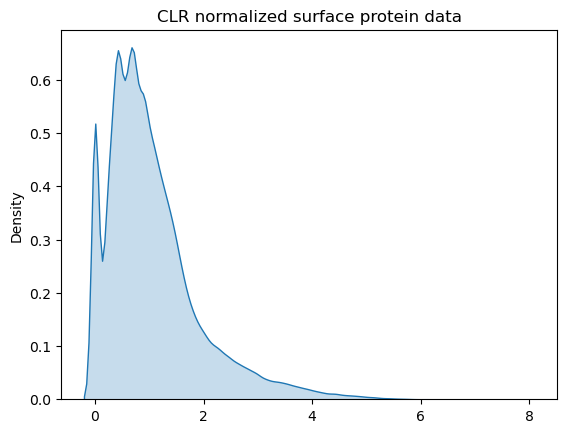

In [25]:
flatten_df = prot.to_numpy().flatten()

sb.kdeplot(flatten_df, fill = True) ; 


plt.title("CLR normalized surface protein data") ;

In [26]:
score_yang = eg_nk.obs['marker_score']

In [27]:
score_yang

GTAGTACCAATCCTTT-1-s4d1    1.081415
CTGTGGGTCATGCGGC-1-s4d1    1.732371
GCAACATTCGCAAGAG-1-s4d1    0.142511
TCACGGGTCGCACGAC-1-s4d1    1.720808
CGCCAGAAGACCATTC-1-s4d1    1.894504
                             ...   
ATCATTCGTCCAATCA-1-s1d3    1.424578
ACATTTCCAGCAGTGA-1-s1d3    1.666697
TGAGACTTCCTTCAGC-1-s1d3    1.064045
GAGATGGTCCGCCTAT-1-s1d3    1.972877
ACCTGTCTCACAGTGT-1-s1d3    1.180738
Name: marker_score, Length: 2640, dtype: float64

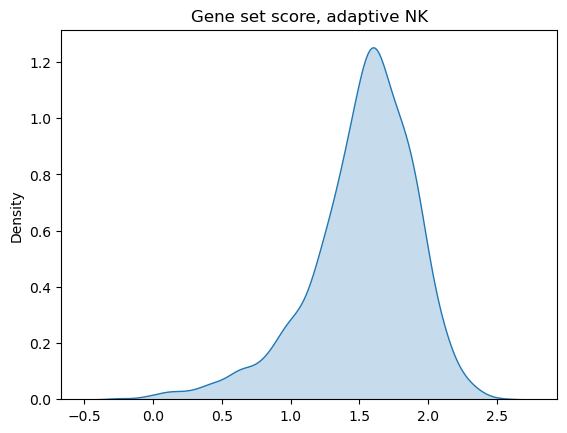

In [28]:
flatten_df1 = score_yang.to_numpy().flatten()

sb.kdeplot(flatten_df1, fill = True) ; 

plt.title("Gene set score") ;

In [31]:
#Creating df containign surface protein data + scores for gene sets

a = score_yang
b = prot

df =pd.concat([a, b], axis=1)


In [32]:
df

,marker_score,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,...,CD94,CD162,CD85j,CD23,CD328,HLA-E,CD82,CD101,CD88,CD224
GTAGTACCAATCCTTT-1-s4d1,1.081415,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,...,2.475005,1.804603,1.069921,1.496785,2.696518,1.532575,0.614600,0.900688,1.389844,0.918109
CTGTGGGTCATGCGGC-1-s4d1,1.732371,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,...,1.408073,1.772872,0.890506,1.188863,2.678422,1.344431,0.353792,0.860303,0.979461,1.147198
GCAACATTCGCAAGAG-1-s4d1,0.142511,0.378666,1.192753,1.208881,0.000000,1.456877,1.046035,1.333993,0.638218,1.360894,...,2.174035,1.013704,1.148843,1.332566,0.000000,1.218539,0.670407,0.329073,1.280509,0.676616
TCACGGGTCGCACGAC-1-s4d1,1.720808,0.000000,0.849902,1.548700,0.730824,1.530781,1.883102,1.686271,1.240123,1.804089,...,3.016060,1.587440,1.623280,1.552023,2.164676,1.456232,0.614600,0.576253,1.189870,1.000442
CGCCAGAAGACCATTC-1-s4d1,1.894504,0.652674,1.249182,1.404314,0.306698,1.417770,1.664855,1.409627,1.302726,1.663363,...,2.826218,2.465725,1.524077,1.637802,3.066941,1.556781,0.276377,0.680162,1.415407,0.729806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCATTCGTCCAATCA-1-s1d3,1.424578,0.000000,0.568367,1.124479,1.027708,0.600556,2.007513,1.679342,0.749707,0.545181,...,4.481286,2.345961,0.391222,0.700530,4.391692,1.556781,0.353792,0.519947,0.809714,0.357584
ACATTTCCAGCAGTGA-1-s1d3,1.666697,0.000000,0.671273,0.856802,0.000000,0.284617,1.105431,0.818721,0.201533,0.309292,...,2.122566,1.496074,0.391222,0.410393,2.678422,0.950948,0.555495,0.519947,0.546717,0.194691
TGAGACTTCCTTCAGC-1-s1d3,1.064045,0.000000,0.671273,0.734526,0.306698,0.284617,1.255114,1.174628,0.749707,0.625887,...,0.365443,1.296756,0.214622,0.410393,3.910620,0.374154,0.492675,0.396827,0.418509,0.000000
GAGATGGTCCGCCTAT-1-s1d3,1.972877,0.000000,0.928521,0.999570,0.541080,0.600556,1.759143,2.420602,1.024682,0.700563,...,2.986818,1.976363,0.214622,0.990050,1.800479,1.532575,0.555495,0.576253,0.546717,0.430053


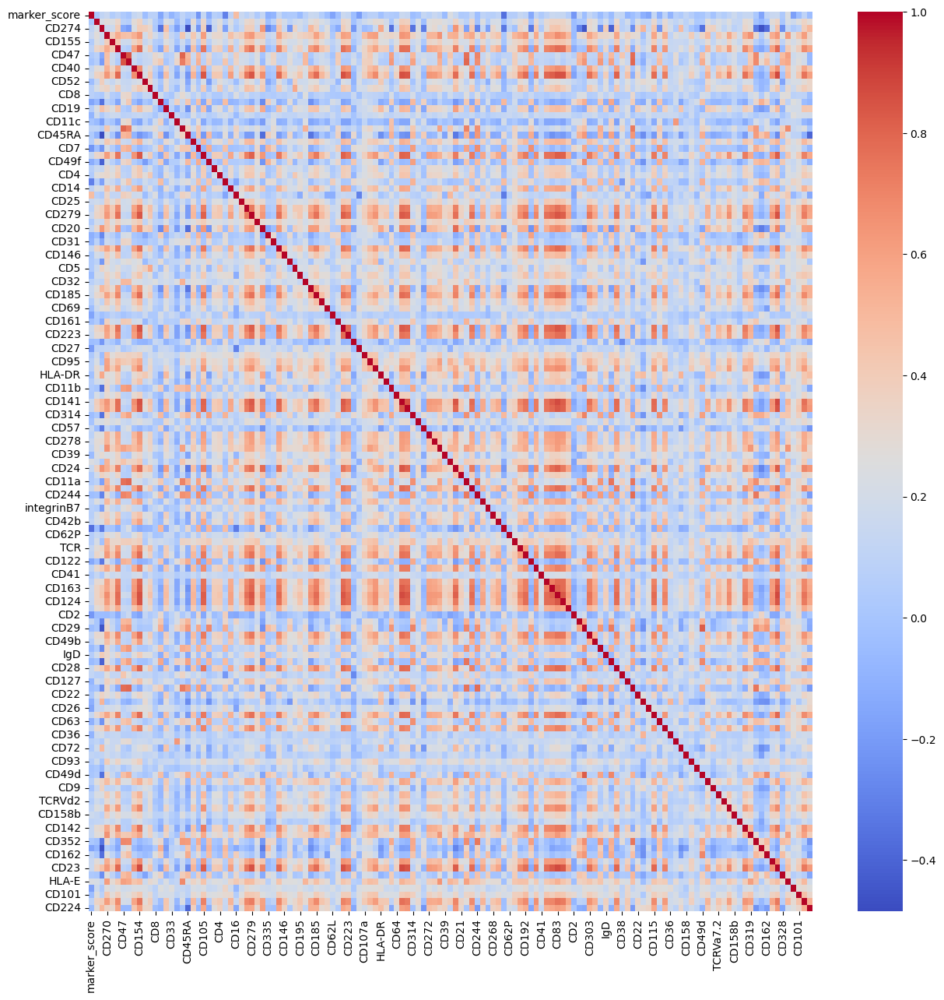

In [34]:
plt.figure(figsize=(15,15))
sb.heatmap(data=df.corr(),cmap='coolwarm')
plt.show()

In [37]:
df

,marker_score,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,...,CD94,CD162,CD85j,CD23,CD328,HLA-E,CD82,CD101,CD88,CD224
GTAGTACCAATCCTTT-1-s4d1,1.081415,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,...,2.475005,1.804603,1.069921,1.496785,2.696518,1.532575,0.614600,0.900688,1.389844,0.918109
CTGTGGGTCATGCGGC-1-s4d1,1.732371,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,...,1.408073,1.772872,0.890506,1.188863,2.678422,1.344431,0.353792,0.860303,0.979461,1.147198
GCAACATTCGCAAGAG-1-s4d1,0.142511,0.378666,1.192753,1.208881,0.000000,1.456877,1.046035,1.333993,0.638218,1.360894,...,2.174035,1.013704,1.148843,1.332566,0.000000,1.218539,0.670407,0.329073,1.280509,0.676616
TCACGGGTCGCACGAC-1-s4d1,1.720808,0.000000,0.849902,1.548700,0.730824,1.530781,1.883102,1.686271,1.240123,1.804089,...,3.016060,1.587440,1.623280,1.552023,2.164676,1.456232,0.614600,0.576253,1.189870,1.000442
CGCCAGAAGACCATTC-1-s4d1,1.894504,0.652674,1.249182,1.404314,0.306698,1.417770,1.664855,1.409627,1.302726,1.663363,...,2.826218,2.465725,1.524077,1.637802,3.066941,1.556781,0.276377,0.680162,1.415407,0.729806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCATTCGTCCAATCA-1-s1d3,1.424578,0.000000,0.568367,1.124479,1.027708,0.600556,2.007513,1.679342,0.749707,0.545181,...,4.481286,2.345961,0.391222,0.700530,4.391692,1.556781,0.353792,0.519947,0.809714,0.357584
ACATTTCCAGCAGTGA-1-s1d3,1.666697,0.000000,0.671273,0.856802,0.000000,0.284617,1.105431,0.818721,0.201533,0.309292,...,2.122566,1.496074,0.391222,0.410393,2.678422,0.950948,0.555495,0.519947,0.546717,0.194691
TGAGACTTCCTTCAGC-1-s1d3,1.064045,0.000000,0.671273,0.734526,0.306698,0.284617,1.255114,1.174628,0.749707,0.625887,...,0.365443,1.296756,0.214622,0.410393,3.910620,0.374154,0.492675,0.396827,0.418509,0.000000
GAGATGGTCCGCCTAT-1-s1d3,1.972877,0.000000,0.928521,0.999570,0.541080,0.600556,1.759143,2.420602,1.024682,0.700563,...,2.986818,1.976363,0.214622,0.990050,1.800479,1.532575,0.555495,0.576253,0.546717,0.430053


## 1. RandomForestRegressor

In [38]:
#Random forest

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params = {#'bootstrap': [True, False],
 'max_depth': [3,5,7],
 #'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'],
 'min_samples_leaf': [2, 5, 10],
 #'min_samples_split': [2, 5, 10] ,
 #'n_estimators': [10, 50, 100]
}


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(RandomForestRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model = result.best_estimator_
y_pred = best_model.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)
    

Mean squared error: 0.10 R2 score: 0.33


In [39]:
#Mean training scores

print(mean_train_score)

[array([-0.09747892, -0.09735459, -0.09785456, -0.07621013, -0.077191  ,
       -0.08007054, -0.05739465, -0.06013339, -0.06660198])]


In [40]:
# The best score and parameters

print(result.best_score_)
print(result.best_params_)

-0.09754840948006925
{'max_depth': 7, 'min_samples_leaf': 5}


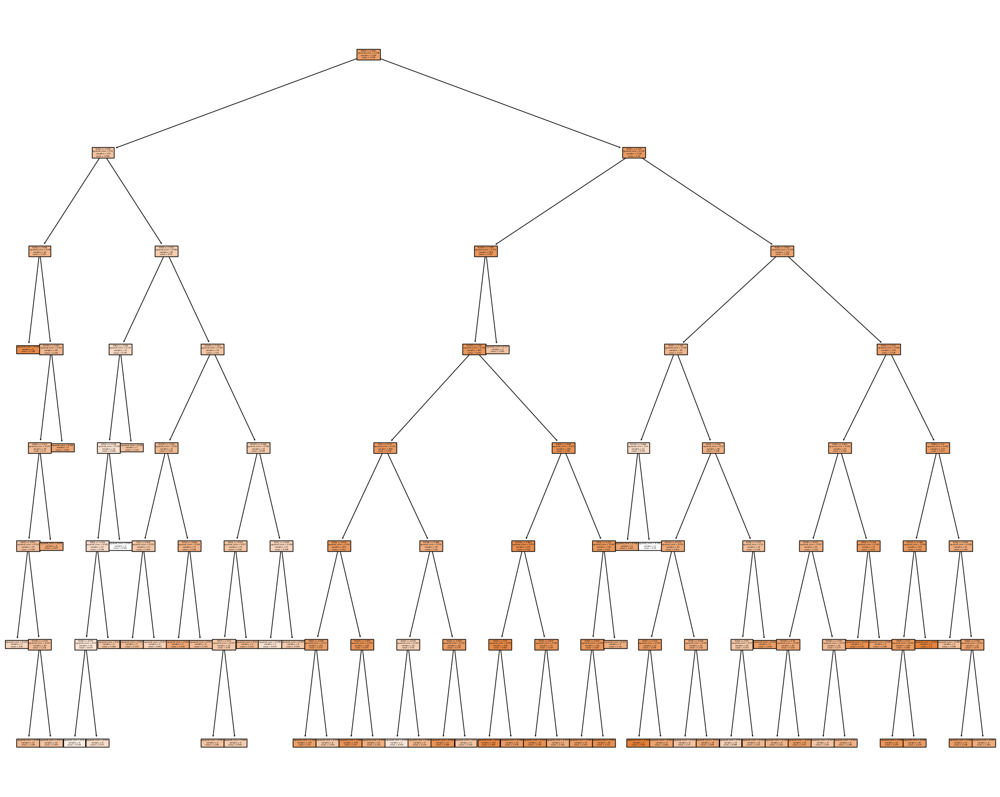

In [41]:
from sklearn import tree

plt.figure(figsize=(25, 20)) # Resize figure
tree.plot_tree(best_model.estimators_[0], filled = True) ;

plt.show()

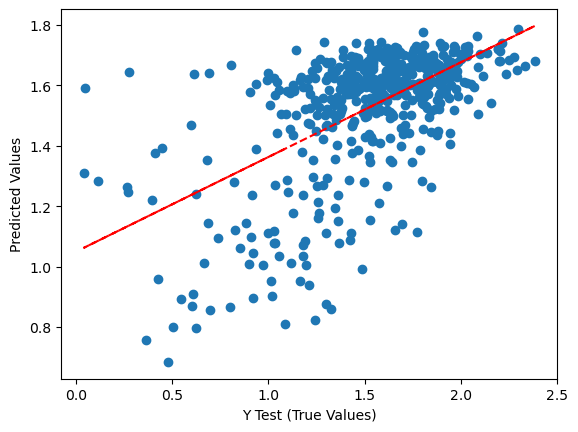

In [42]:
plt.scatter(y_test, y_pred)

# Add a trendline
z = np.polyfit(y_test, y_pred, 1)
p = np.poly1d(z)
plt.plot(y_test, p(y_test), 'r--')
# Add labels
plt.xlabel('Y Test (True Values)')
plt.ylabel('Predicted Values')
plt.show()

<AxesSubplot: xlabel='marker_score', ylabel='Density'>

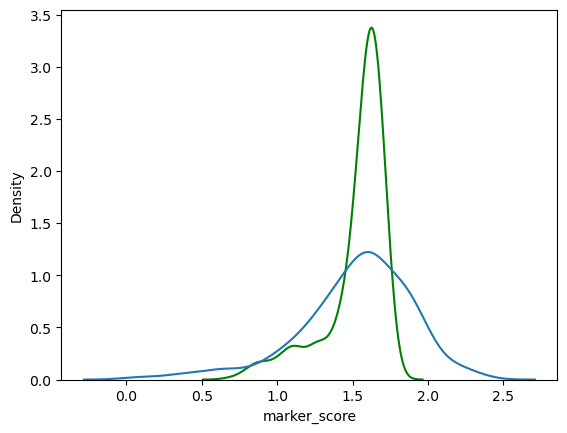

In [43]:
sb.kdeplot(y_pred, color = "g") #predicted values
sb.kdeplot(y_test) #observed values

In [44]:
#Feature importances

importances_rf = best_model.feature_importances_
importances_rf = pd.Series(importances_rf, index=prot.columns)
importances_rf=importances_rf.sort_values(ascending=False)

print(importances_rf.head(10))

CD16     0.394992
CD54     0.070069
CD44     0.043654
CD47     0.026708
CD7      0.019080
KLRG1    0.018695
CD57     0.015041
CD2      0.013802
CD328    0.011763
CD335    0.011271
dtype: float64


In [45]:
#df from the top 20 important markers
importances_rf=pd.DataFrame(importances_rf)
importances_rf_top=importances_rf[0:20]
importances_rf_top=importances_rf_top.T

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


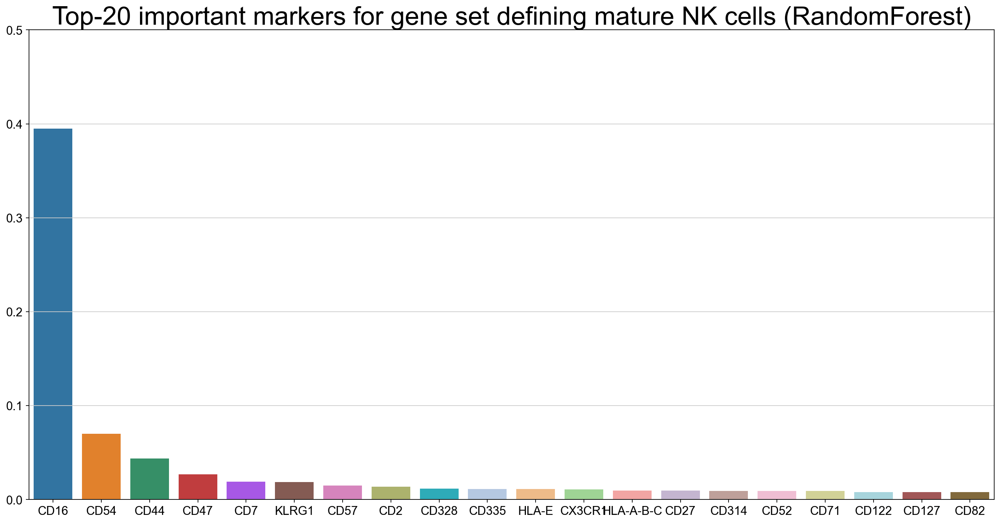

In [71]:
plt.figure(figsize=(20,10))
plt.ylim(0,0.5)
a=sb.barplot(data=importances_rf_top)

plt.title("Top-20 important markers for gene set defining mature NK cells (RandomForest)", fontsize = 30) ;


## 2. Dummy Reggressor

In [47]:
from sklearn.dummy import DummyRegressor

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params =  {'strategy': ["mean", "median"]}


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(DummyRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model_dummy = result.best_estimator_
y_pred = best_model_dummy.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)

Mean squared error: 0.14 R2 score: -0.00


In [48]:
print(mean_train_score)

[array([-0.14981735, -0.15278429])]


## 3. GragientBoostingRegressor

In [49]:
#Gradient boosting regressor

from sklearn.ensemble import GradientBoostingRegressor

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params =  {'max_depth': [3,5,7],
          'min_samples_leaf': [2, 5, 10]}


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(GradientBoostingRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model_gbr = result.best_estimator_
y_pred = best_model_gbr.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)

Mean squared error: 0.09 R2 score: 0.36


In [50]:
print(mean_train_score)

[array([-0.04889667, -0.04919497, -0.05055408, -0.01390197, -0.01472349,
       -0.01787516, -0.00166574, -0.00204454, -0.00431131])]


<AxesSubplot: xlabel='marker_score', ylabel='Density'>

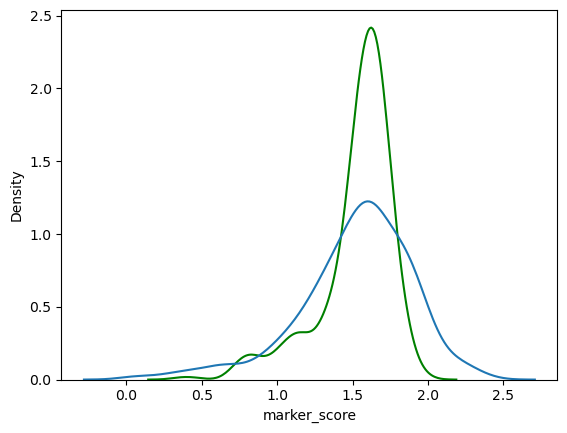

In [51]:
sb.kdeplot(y_pred, color = "g")
sb.kdeplot(y_test)

In [52]:
importances_gbr = best_model_gbr.feature_importances_
importances_gbr = pd.Series(importances_gbr, index=prot.columns)
importances_gbr=importances_gbr.sort_values(ascending=False)

print(importances_gbr.head(10))

CD16     0.255087
CD44     0.046241
CD54     0.041599
CD47     0.038455
CD7      0.020619
HLA-E    0.017610
CD162    0.016845
CD57     0.016342
CD328    0.015374
CD335    0.014946
dtype: float64


In [53]:
#df from the top 20 important markers
importances_gbr=pd.DataFrame(importances_gbr)
importances_gbr_top=importances_gbr[0:20]
importances_gbr_top=importances_gbr_top.T

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


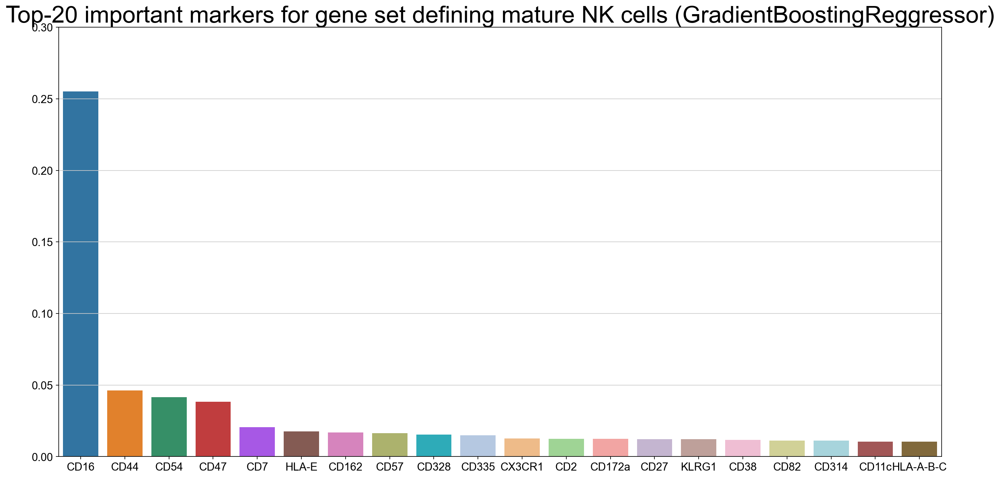

In [72]:
plt.figure(figsize=(20,10))
plt.ylim(0,0.3)
a=sb.barplot(data=importances_gbr_top)

plt.title("Top-20 important markers for gene set defining mature NK cells (GradientBoostingReggressor)", fontsize = 30) ;



## 4. CatBoostRegressor

In [55]:
pip install catboost

Note: you may need to restart the kernel to use updated packages.


In [56]:
from catboost import CatBoostRegressor

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params= {'depth': [6,8,10],
        'learning_rate' : [0.01, 0.05, 0.1],
        'iterations'    : [30, 50, 100]
                 }

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(CatBoostRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model_cb = result.best_estimator_
y_pred = best_model_cb.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)

0:	learn: 0.3827027	total: 70.5ms	remaining: 2.04s
1:	learn: 0.3818875	total: 73.5ms	remaining: 1.03s
2:	learn: 0.3810288	total: 76ms	remaining: 684ms
3:	learn: 0.3802181	total: 78.9ms	remaining: 513ms
4:	learn: 0.3793621	total: 81.3ms	remaining: 407ms
5:	learn: 0.3785642	total: 83.6ms	remaining: 334ms
6:	learn: 0.3776830	total: 85.9ms	remaining: 282ms
7:	learn: 0.3769143	total: 88.2ms	remaining: 243ms
8:	learn: 0.3761023	total: 90.6ms	remaining: 211ms
9:	learn: 0.3751109	total: 92.9ms	remaining: 186ms
10:	learn: 0.3743792	total: 95.5ms	remaining: 165ms
11:	learn: 0.3736466	total: 97.9ms	remaining: 147ms
12:	learn: 0.3728795	total: 100ms	remaining: 131ms
13:	learn: 0.3721155	total: 102ms	remaining: 117ms
14:	learn: 0.3714935	total: 105ms	remaining: 105ms
15:	learn: 0.3708523	total: 107ms	remaining: 93.6ms
16:	learn: 0.3701317	total: 109ms	remaining: 83.6ms
17:	learn: 0.3693361	total: 112ms	remaining: 74.4ms
18:	learn: 0.3685634	total: 114ms	remaining: 65.9ms
19:	learn: 0.3677985	total:

22:	learn: 0.3702988	total: 97.9ms	remaining: 29.8ms
23:	learn: 0.3695272	total: 103ms	remaining: 25.7ms
24:	learn: 0.3688438	total: 108ms	remaining: 21.6ms
25:	learn: 0.3680177	total: 112ms	remaining: 17.2ms
26:	learn: 0.3673392	total: 115ms	remaining: 12.8ms
27:	learn: 0.3666663	total: 118ms	remaining: 8.45ms
28:	learn: 0.3660290	total: 122ms	remaining: 4.2ms
29:	learn: 0.3652760	total: 126ms	remaining: 0us
0:	learn: 0.3847687	total: 4.72ms	remaining: 137ms
1:	learn: 0.3838502	total: 7.84ms	remaining: 110ms
2:	learn: 0.3830175	total: 11.2ms	remaining: 101ms
3:	learn: 0.3822026	total: 14.5ms	remaining: 94ms
4:	learn: 0.3813408	total: 19.5ms	remaining: 97.4ms
5:	learn: 0.3805382	total: 23ms	remaining: 92ms
6:	learn: 0.3794888	total: 26.2ms	remaining: 86.1ms
7:	learn: 0.3787423	total: 29.2ms	remaining: 80.3ms
8:	learn: 0.3779254	total: 32.3ms	remaining: 75.4ms
9:	learn: 0.3771943	total: 35.6ms	remaining: 71.2ms
10:	learn: 0.3764623	total: 38.4ms	remaining: 66.3ms
11:	learn: 0.3757267	to

7:	learn: 0.3585098	total: 19.7ms	remaining: 54.3ms
8:	learn: 0.3552921	total: 22.4ms	remaining: 52.3ms
9:	learn: 0.3529967	total: 24.9ms	remaining: 49.9ms
10:	learn: 0.3507488	total: 27.4ms	remaining: 47.4ms
11:	learn: 0.3483641	total: 29.8ms	remaining: 44.7ms
12:	learn: 0.3461729	total: 32.1ms	remaining: 42ms
13:	learn: 0.3441555	total: 34.8ms	remaining: 39.8ms
14:	learn: 0.3424860	total: 37.2ms	remaining: 37.2ms
15:	learn: 0.3404203	total: 39.5ms	remaining: 34.6ms
16:	learn: 0.3387784	total: 42.2ms	remaining: 32.3ms
17:	learn: 0.3370994	total: 45ms	remaining: 30ms
18:	learn: 0.3347772	total: 47.7ms	remaining: 27.6ms
19:	learn: 0.3327831	total: 50.5ms	remaining: 25.3ms
20:	learn: 0.3312760	total: 53.1ms	remaining: 22.8ms
21:	learn: 0.3298207	total: 55.7ms	remaining: 20.2ms
22:	learn: 0.3280182	total: 58.2ms	remaining: 17.7ms
23:	learn: 0.3263633	total: 60.5ms	remaining: 15.1ms
24:	learn: 0.3246828	total: 62.8ms	remaining: 12.6ms
25:	learn: 0.3234293	total: 65.6ms	remaining: 10.1ms
26

16:	learn: 0.3389301	total: 44.4ms	remaining: 34ms
17:	learn: 0.3370139	total: 47.1ms	remaining: 31.4ms
18:	learn: 0.3347255	total: 50.3ms	remaining: 29.1ms
19:	learn: 0.3327545	total: 52.7ms	remaining: 26.3ms
20:	learn: 0.3312865	total: 55.2ms	remaining: 23.7ms
21:	learn: 0.3297446	total: 57.9ms	remaining: 21ms
22:	learn: 0.3283684	total: 60.5ms	remaining: 18.4ms
23:	learn: 0.3266986	total: 63.1ms	remaining: 15.8ms
24:	learn: 0.3250402	total: 65.8ms	remaining: 13.2ms
25:	learn: 0.3233052	total: 68.6ms	remaining: 10.6ms
26:	learn: 0.3217174	total: 71.5ms	remaining: 7.94ms
27:	learn: 0.3206698	total: 74.8ms	remaining: 5.35ms
28:	learn: 0.3194115	total: 77.4ms	remaining: 2.67ms
29:	learn: 0.3179903	total: 80.9ms	remaining: 0us
0:	learn: 0.3764525	total: 3.42ms	remaining: 99.3ms
1:	learn: 0.3724379	total: 5.9ms	remaining: 82.6ms
2:	learn: 0.3687487	total: 8.28ms	remaining: 74.5ms
3:	learn: 0.3650996	total: 10.7ms	remaining: 69.7ms
4:	learn: 0.3614739	total: 13.3ms	remaining: 66.5ms
5:	lea

26:	learn: 0.2959143	total: 67.9ms	remaining: 7.54ms
27:	learn: 0.2946681	total: 70.9ms	remaining: 5.07ms
28:	learn: 0.2933799	total: 73.6ms	remaining: 2.54ms
29:	learn: 0.2919613	total: 76.3ms	remaining: 0us
0:	learn: 0.3788145	total: 2.76ms	remaining: 80.1ms
1:	learn: 0.3707576	total: 5.45ms	remaining: 76.2ms
2:	learn: 0.3635131	total: 8.81ms	remaining: 79.3ms
3:	learn: 0.3576554	total: 11.2ms	remaining: 72.7ms
4:	learn: 0.3531028	total: 13.5ms	remaining: 67.7ms
5:	learn: 0.3487481	total: 15.8ms	remaining: 63.3ms
6:	learn: 0.3439054	total: 18.2ms	remaining: 59.7ms
7:	learn: 0.3393832	total: 20.6ms	remaining: 56.7ms
8:	learn: 0.3359762	total: 22.9ms	remaining: 53.4ms
9:	learn: 0.3327214	total: 25.4ms	remaining: 50.8ms
10:	learn: 0.3292376	total: 28.1ms	remaining: 48.5ms
11:	learn: 0.3259376	total: 30.5ms	remaining: 45.8ms
12:	learn: 0.3232072	total: 33ms	remaining: 43.1ms
13:	learn: 0.3206567	total: 35.5ms	remaining: 40.6ms
14:	learn: 0.3184850	total: 39.2ms	remaining: 39.2ms
15:	lear

8:	learn: 0.3761023	total: 25.1ms	remaining: 115ms
9:	learn: 0.3751109	total: 29ms	remaining: 116ms
10:	learn: 0.3743792	total: 32ms	remaining: 114ms
11:	learn: 0.3736466	total: 35.1ms	remaining: 111ms
12:	learn: 0.3728795	total: 37.9ms	remaining: 108ms
13:	learn: 0.3721155	total: 40.9ms	remaining: 105ms
14:	learn: 0.3714935	total: 43.6ms	remaining: 102ms
15:	learn: 0.3708523	total: 46ms	remaining: 97.8ms
16:	learn: 0.3701317	total: 48.8ms	remaining: 94.7ms
17:	learn: 0.3693361	total: 51.8ms	remaining: 92.1ms
18:	learn: 0.3685634	total: 54.4ms	remaining: 88.7ms
19:	learn: 0.3677985	total: 56.8ms	remaining: 85.2ms
20:	learn: 0.3671689	total: 59.7ms	remaining: 82.5ms
21:	learn: 0.3665824	total: 62.2ms	remaining: 79.2ms
22:	learn: 0.3658915	total: 65ms	remaining: 76.3ms
23:	learn: 0.3652259	total: 67.5ms	remaining: 73.1ms
24:	learn: 0.3645566	total: 70.2ms	remaining: 70.2ms
25:	learn: 0.3638246	total: 73ms	remaining: 67.4ms
26:	learn: 0.3632611	total: 75.7ms	remaining: 64.5ms
27:	learn: 0

9:	learn: 0.3766813	total: 24.8ms	remaining: 99.3ms
10:	learn: 0.3759398	total: 27.6ms	remaining: 97.8ms
11:	learn: 0.3751523	total: 30ms	remaining: 95.1ms
12:	learn: 0.3743410	total: 32.4ms	remaining: 92.1ms
13:	learn: 0.3736098	total: 35.4ms	remaining: 91ms
14:	learn: 0.3729264	total: 37.8ms	remaining: 88.2ms
15:	learn: 0.3722405	total: 40.2ms	remaining: 85.5ms
16:	learn: 0.3714818	total: 43.3ms	remaining: 84.1ms
17:	learn: 0.3706265	total: 45.8ms	remaining: 81.4ms
18:	learn: 0.3699471	total: 48.7ms	remaining: 79.4ms
19:	learn: 0.3690947	total: 51.5ms	remaining: 77.3ms
20:	learn: 0.3684990	total: 54.5ms	remaining: 75.2ms
21:	learn: 0.3677285	total: 57ms	remaining: 72.6ms
22:	learn: 0.3670007	total: 59.6ms	remaining: 70ms
23:	learn: 0.3661512	total: 62.2ms	remaining: 67.4ms
24:	learn: 0.3654548	total: 64.8ms	remaining: 64.8ms
25:	learn: 0.3647411	total: 67.4ms	remaining: 62.2ms
26:	learn: 0.3640539	total: 69.9ms	remaining: 59.6ms
27:	learn: 0.3632983	total: 72.4ms	remaining: 56.9ms
28

11:	learn: 0.3792292	total: 30.3ms	remaining: 96ms
12:	learn: 0.3784094	total: 33.1ms	remaining: 94.3ms
13:	learn: 0.3775874	total: 35.9ms	remaining: 92.2ms
14:	learn: 0.3769249	total: 38.3ms	remaining: 89.5ms
15:	learn: 0.3762230	total: 41ms	remaining: 87ms
16:	learn: 0.3754799	total: 44.6ms	remaining: 86.5ms
17:	learn: 0.3747427	total: 46.9ms	remaining: 83.4ms
18:	learn: 0.3740280	total: 49.4ms	remaining: 80.5ms
19:	learn: 0.3732781	total: 52.2ms	remaining: 78.3ms
20:	learn: 0.3725996	total: 55ms	remaining: 75.9ms
21:	learn: 0.3719230	total: 57.5ms	remaining: 73.2ms
22:	learn: 0.3712135	total: 60.6ms	remaining: 71.1ms
23:	learn: 0.3705214	total: 62.9ms	remaining: 68.1ms
24:	learn: 0.3697992	total: 65ms	remaining: 65ms
25:	learn: 0.3689980	total: 67.6ms	remaining: 62.4ms
26:	learn: 0.3683961	total: 70.2ms	remaining: 59.8ms
27:	learn: 0.3676739	total: 72.6ms	remaining: 57ms
28:	learn: 0.3670268	total: 75ms	remaining: 54.3ms
29:	learn: 0.3663877	total: 77.7ms	remaining: 51.8ms
30:	learn

14:	learn: 0.3424860	total: 35.4ms	remaining: 82.6ms
15:	learn: 0.3404203	total: 38.1ms	remaining: 81.1ms
16:	learn: 0.3387784	total: 41ms	remaining: 79.6ms
17:	learn: 0.3370994	total: 43.6ms	remaining: 77.5ms
18:	learn: 0.3347772	total: 46.2ms	remaining: 75.3ms
19:	learn: 0.3327831	total: 48.8ms	remaining: 73.3ms
20:	learn: 0.3312760	total: 51.5ms	remaining: 71.2ms
21:	learn: 0.3298207	total: 54.3ms	remaining: 69.1ms
22:	learn: 0.3280182	total: 56.9ms	remaining: 66.8ms
23:	learn: 0.3263633	total: 59.9ms	remaining: 64.9ms
24:	learn: 0.3246828	total: 63.7ms	remaining: 63.7ms
25:	learn: 0.3234293	total: 66.3ms	remaining: 61.2ms
26:	learn: 0.3217626	total: 69.7ms	remaining: 59.4ms
27:	learn: 0.3206799	total: 72.8ms	remaining: 57.2ms
28:	learn: 0.3195954	total: 75.3ms	remaining: 54.5ms
29:	learn: 0.3182755	total: 77.9ms	remaining: 51.9ms
30:	learn: 0.3170948	total: 81ms	remaining: 49.6ms
31:	learn: 0.3162520	total: 83.7ms	remaining: 47.1ms
32:	learn: 0.3148573	total: 86.3ms	remaining: 44.5

20:	learn: 0.3311453	total: 54.1ms	remaining: 74.7ms
21:	learn: 0.3300044	total: 57.7ms	remaining: 73.4ms
22:	learn: 0.3284662	total: 60.1ms	remaining: 70.6ms
23:	learn: 0.3272211	total: 62.8ms	remaining: 68ms
24:	learn: 0.3256724	total: 65.3ms	remaining: 65.3ms
25:	learn: 0.3239850	total: 68.1ms	remaining: 62.9ms
26:	learn: 0.3223255	total: 70.8ms	remaining: 60.3ms
27:	learn: 0.3211700	total: 73.1ms	remaining: 57.4ms
28:	learn: 0.3201363	total: 75.6ms	remaining: 54.8ms
29:	learn: 0.3185215	total: 78.3ms	remaining: 52.2ms
30:	learn: 0.3169354	total: 81.3ms	remaining: 49.8ms
31:	learn: 0.3159804	total: 84.1ms	remaining: 47.3ms
32:	learn: 0.3146410	total: 86.6ms	remaining: 44.6ms
33:	learn: 0.3132638	total: 89.2ms	remaining: 42ms
34:	learn: 0.3124139	total: 91.6ms	remaining: 39.3ms
35:	learn: 0.3111702	total: 94.2ms	remaining: 36.6ms
36:	learn: 0.3103875	total: 96.6ms	remaining: 34ms
37:	learn: 0.3094793	total: 99.2ms	remaining: 31.3ms
38:	learn: 0.3089599	total: 102ms	remaining: 28.7ms


21:	learn: 0.3041374	total: 57.3ms	remaining: 73ms
22:	learn: 0.3029419	total: 60.1ms	remaining: 70.6ms
23:	learn: 0.3017457	total: 62.8ms	remaining: 68ms
24:	learn: 0.3012082	total: 65.5ms	remaining: 65.5ms
25:	learn: 0.3000032	total: 68ms	remaining: 62.8ms
26:	learn: 0.2982903	total: 70.8ms	remaining: 60.3ms
27:	learn: 0.2971050	total: 73.3ms	remaining: 57.6ms
28:	learn: 0.2963461	total: 76ms	remaining: 55ms
29:	learn: 0.2950409	total: 78.5ms	remaining: 52.3ms
30:	learn: 0.2935265	total: 81ms	remaining: 49.7ms
31:	learn: 0.2922036	total: 83.9ms	remaining: 47.2ms
32:	learn: 0.2906946	total: 87.1ms	remaining: 44.9ms
33:	learn: 0.2896191	total: 89.6ms	remaining: 42.2ms
34:	learn: 0.2882197	total: 92.1ms	remaining: 39.5ms
35:	learn: 0.2870037	total: 94.4ms	remaining: 36.7ms
36:	learn: 0.2857905	total: 97ms	remaining: 34.1ms
37:	learn: 0.2853088	total: 99.6ms	remaining: 31.5ms
38:	learn: 0.2844265	total: 102ms	remaining: 28.8ms
39:	learn: 0.2833963	total: 105ms	remaining: 26.3ms
40:	learn

25:	learn: 0.2969679	total: 65.2ms	remaining: 60.1ms
26:	learn: 0.2959143	total: 68.1ms	remaining: 58ms
27:	learn: 0.2946681	total: 70.9ms	remaining: 55.7ms
28:	learn: 0.2933799	total: 73.6ms	remaining: 53.3ms
29:	learn: 0.2919613	total: 76.2ms	remaining: 50.8ms
30:	learn: 0.2903339	total: 78.9ms	remaining: 48.4ms
31:	learn: 0.2897512	total: 81.5ms	remaining: 45.8ms
32:	learn: 0.2882538	total: 84.1ms	remaining: 43.3ms
33:	learn: 0.2873008	total: 86.9ms	remaining: 40.9ms
34:	learn: 0.2861574	total: 89.7ms	remaining: 38.4ms
35:	learn: 0.2846244	total: 92.5ms	remaining: 36ms
36:	learn: 0.2837187	total: 95.4ms	remaining: 33.5ms
37:	learn: 0.2832023	total: 97.7ms	remaining: 30.8ms
38:	learn: 0.2821345	total: 100ms	remaining: 28.3ms
39:	learn: 0.2813308	total: 103ms	remaining: 25.7ms
40:	learn: 0.2805796	total: 106ms	remaining: 23.3ms
41:	learn: 0.2791677	total: 108ms	remaining: 20.6ms
42:	learn: 0.2780288	total: 111ms	remaining: 18ms
43:	learn: 0.2776027	total: 113ms	remaining: 15.4ms
44:	l

28:	learn: 0.2955628	total: 75ms	remaining: 54.3ms
29:	learn: 0.2943670	total: 77.6ms	remaining: 51.8ms
30:	learn: 0.2928752	total: 80.3ms	remaining: 49.2ms
31:	learn: 0.2910401	total: 82.8ms	remaining: 46.6ms
32:	learn: 0.2900828	total: 85.4ms	remaining: 44ms
33:	learn: 0.2886112	total: 87.9ms	remaining: 41.4ms
34:	learn: 0.2880045	total: 90.7ms	remaining: 38.9ms
35:	learn: 0.2868891	total: 93.2ms	remaining: 36.2ms
36:	learn: 0.2857471	total: 95.9ms	remaining: 33.7ms
37:	learn: 0.2853040	total: 98.8ms	remaining: 31.2ms
38:	learn: 0.2846388	total: 102ms	remaining: 28.7ms
39:	learn: 0.2836666	total: 104ms	remaining: 26.1ms
40:	learn: 0.2824120	total: 107ms	remaining: 23.4ms
41:	learn: 0.2815012	total: 109ms	remaining: 20.7ms
42:	learn: 0.2807073	total: 111ms	remaining: 18.1ms
43:	learn: 0.2798530	total: 114ms	remaining: 15.5ms
44:	learn: 0.2782761	total: 116ms	remaining: 12.9ms
45:	learn: 0.2768002	total: 119ms	remaining: 10.3ms
46:	learn: 0.2765754	total: 121ms	remaining: 7.73ms
47:	le

39:	learn: 0.3636260	total: 101ms	remaining: 152ms
40:	learn: 0.3630238	total: 104ms	remaining: 150ms
41:	learn: 0.3625131	total: 106ms	remaining: 147ms
42:	learn: 0.3619511	total: 109ms	remaining: 144ms
43:	learn: 0.3613833	total: 112ms	remaining: 142ms
44:	learn: 0.3607617	total: 114ms	remaining: 140ms
45:	learn: 0.3602216	total: 117ms	remaining: 137ms
46:	learn: 0.3596621	total: 120ms	remaining: 135ms
47:	learn: 0.3589243	total: 122ms	remaining: 132ms
48:	learn: 0.3585095	total: 125ms	remaining: 130ms
49:	learn: 0.3579224	total: 128ms	remaining: 128ms
50:	learn: 0.3574017	total: 131ms	remaining: 126ms
51:	learn: 0.3569049	total: 133ms	remaining: 123ms
52:	learn: 0.3563395	total: 136ms	remaining: 121ms
53:	learn: 0.3558414	total: 139ms	remaining: 118ms
54:	learn: 0.3553709	total: 141ms	remaining: 116ms
55:	learn: 0.3548266	total: 144ms	remaining: 113ms
56:	learn: 0.3543745	total: 147ms	remaining: 111ms
57:	learn: 0.3538643	total: 149ms	remaining: 108ms
58:	learn: 0.3534094	total: 152

55:	learn: 0.3514003	total: 142ms	remaining: 111ms
56:	learn: 0.3510109	total: 145ms	remaining: 109ms
57:	learn: 0.3504844	total: 148ms	remaining: 107ms
58:	learn: 0.3500215	total: 151ms	remaining: 105ms
59:	learn: 0.3496252	total: 153ms	remaining: 102ms
60:	learn: 0.3491362	total: 156ms	remaining: 99.7ms
61:	learn: 0.3485992	total: 158ms	remaining: 97.1ms
62:	learn: 0.3480383	total: 161ms	remaining: 94.8ms
63:	learn: 0.3476610	total: 164ms	remaining: 92.5ms
64:	learn: 0.3472289	total: 167ms	remaining: 90.1ms
65:	learn: 0.3466491	total: 170ms	remaining: 87.8ms
66:	learn: 0.3462032	total: 173ms	remaining: 85.1ms
67:	learn: 0.3457254	total: 175ms	remaining: 82.4ms
68:	learn: 0.3453058	total: 178ms	remaining: 79.8ms
69:	learn: 0.3449594	total: 180ms	remaining: 77.2ms
70:	learn: 0.3444528	total: 183ms	remaining: 74.7ms
71:	learn: 0.3440578	total: 186ms	remaining: 72.2ms
72:	learn: 0.3436061	total: 188ms	remaining: 69.7ms
73:	learn: 0.3432915	total: 191ms	remaining: 67ms
74:	learn: 0.342902

68:	learn: 0.3445695	total: 181ms	remaining: 81.3ms
69:	learn: 0.3442060	total: 185ms	remaining: 79.2ms
70:	learn: 0.3436823	total: 187ms	remaining: 76.6ms
71:	learn: 0.3432443	total: 191ms	remaining: 74.1ms
72:	learn: 0.3428016	total: 193ms	remaining: 71.5ms
73:	learn: 0.3422820	total: 196ms	remaining: 68.8ms
74:	learn: 0.3418178	total: 198ms	remaining: 66.1ms
75:	learn: 0.3414755	total: 201ms	remaining: 63.5ms
76:	learn: 0.3410850	total: 204ms	remaining: 60.8ms
77:	learn: 0.3406404	total: 207ms	remaining: 58.3ms
78:	learn: 0.3402038	total: 210ms	remaining: 55.8ms
79:	learn: 0.3397993	total: 213ms	remaining: 53.2ms
80:	learn: 0.3392965	total: 215ms	remaining: 50.5ms
81:	learn: 0.3389015	total: 218ms	remaining: 47.9ms
82:	learn: 0.3385676	total: 221ms	remaining: 45.2ms
83:	learn: 0.3382212	total: 224ms	remaining: 42.6ms
84:	learn: 0.3377056	total: 226ms	remaining: 39.9ms
85:	learn: 0.3372903	total: 229ms	remaining: 37.3ms
86:	learn: 0.3369649	total: 232ms	remaining: 34.6ms
87:	learn: 0

82:	learn: 0.3386536	total: 218ms	remaining: 44.6ms
83:	learn: 0.3383497	total: 221ms	remaining: 42ms
84:	learn: 0.3380248	total: 223ms	remaining: 39.4ms
85:	learn: 0.3376362	total: 226ms	remaining: 36.8ms
86:	learn: 0.3372883	total: 229ms	remaining: 34.2ms
87:	learn: 0.3369265	total: 232ms	remaining: 31.6ms
88:	learn: 0.3366438	total: 234ms	remaining: 29ms
89:	learn: 0.3361771	total: 237ms	remaining: 26.3ms
90:	learn: 0.3357984	total: 240ms	remaining: 23.7ms
91:	learn: 0.3354856	total: 243ms	remaining: 21.1ms
92:	learn: 0.3351993	total: 246ms	remaining: 18.5ms
93:	learn: 0.3348885	total: 248ms	remaining: 15.8ms
94:	learn: 0.3345862	total: 251ms	remaining: 13.2ms
95:	learn: 0.3342493	total: 253ms	remaining: 10.6ms
96:	learn: 0.3338184	total: 256ms	remaining: 7.92ms
97:	learn: 0.3334897	total: 259ms	remaining: 5.28ms
98:	learn: 0.3331148	total: 261ms	remaining: 2.64ms
99:	learn: 0.3328653	total: 264ms	remaining: 0us
0:	learn: 0.3886817	total: 2.52ms	remaining: 250ms
1:	learn: 0.3877218	

98:	learn: 0.3261532	total: 255ms	remaining: 2.58ms
99:	learn: 0.3258328	total: 258ms	remaining: 0us
0:	learn: 0.3789160	total: 2.54ms	remaining: 251ms
1:	learn: 0.3751148	total: 5.11ms	remaining: 250ms
2:	learn: 0.3712939	total: 7.83ms	remaining: 253ms
3:	learn: 0.3675818	total: 10.8ms	remaining: 259ms
4:	learn: 0.3640979	total: 13.1ms	remaining: 249ms
5:	learn: 0.3610243	total: 15.5ms	remaining: 242ms
6:	learn: 0.3577822	total: 17.9ms	remaining: 238ms
7:	learn: 0.3551224	total: 20.9ms	remaining: 240ms
8:	learn: 0.3523835	total: 23.3ms	remaining: 236ms
9:	learn: 0.3493349	total: 25.6ms	remaining: 231ms
10:	learn: 0.3469913	total: 27.9ms	remaining: 226ms
11:	learn: 0.3448057	total: 30.3ms	remaining: 222ms
12:	learn: 0.3426699	total: 32.6ms	remaining: 218ms
13:	learn: 0.3410213	total: 35.2ms	remaining: 216ms
14:	learn: 0.3390058	total: 37.9ms	remaining: 215ms
15:	learn: 0.3372498	total: 40.3ms	remaining: 212ms
16:	learn: 0.3354949	total: 43ms	remaining: 210ms
17:	learn: 0.3339664	total:

8:	learn: 0.3552921	total: 22.3ms	remaining: 225ms
9:	learn: 0.3529967	total: 25.5ms	remaining: 229ms
10:	learn: 0.3507488	total: 27.8ms	remaining: 225ms
11:	learn: 0.3483641	total: 30.4ms	remaining: 223ms
12:	learn: 0.3461729	total: 32.8ms	remaining: 220ms
13:	learn: 0.3441555	total: 35.2ms	remaining: 216ms
14:	learn: 0.3424860	total: 37.9ms	remaining: 215ms
15:	learn: 0.3404203	total: 40.4ms	remaining: 212ms
16:	learn: 0.3387784	total: 43.1ms	remaining: 210ms
17:	learn: 0.3370994	total: 46.2ms	remaining: 210ms
18:	learn: 0.3347772	total: 49.2ms	remaining: 210ms
19:	learn: 0.3327831	total: 51.9ms	remaining: 207ms
20:	learn: 0.3312760	total: 54.4ms	remaining: 205ms
21:	learn: 0.3298207	total: 57.1ms	remaining: 203ms
22:	learn: 0.3280182	total: 60.1ms	remaining: 201ms
23:	learn: 0.3263633	total: 63ms	remaining: 200ms
24:	learn: 0.3246828	total: 65.7ms	remaining: 197ms
25:	learn: 0.3234293	total: 68.4ms	remaining: 195ms
26:	learn: 0.3217626	total: 70.9ms	remaining: 192ms
27:	learn: 0.320

26:	learn: 0.3185408	total: 68.6ms	remaining: 185ms
27:	learn: 0.3174297	total: 71.3ms	remaining: 183ms
28:	learn: 0.3160928	total: 73.9ms	remaining: 181ms
29:	learn: 0.3146406	total: 76.5ms	remaining: 178ms
30:	learn: 0.3134417	total: 79ms	remaining: 176ms
31:	learn: 0.3127697	total: 81.7ms	remaining: 174ms
32:	learn: 0.3111301	total: 84.3ms	remaining: 171ms
33:	learn: 0.3099542	total: 87.4ms	remaining: 170ms
34:	learn: 0.3093132	total: 90.1ms	remaining: 167ms
35:	learn: 0.3080222	total: 92.9ms	remaining: 165ms
36:	learn: 0.3070322	total: 96.2ms	remaining: 164ms
37:	learn: 0.3065797	total: 98.8ms	remaining: 161ms
38:	learn: 0.3057836	total: 101ms	remaining: 158ms
39:	learn: 0.3049115	total: 104ms	remaining: 156ms
40:	learn: 0.3040840	total: 107ms	remaining: 153ms
41:	learn: 0.3028548	total: 109ms	remaining: 151ms
42:	learn: 0.3019914	total: 112ms	remaining: 148ms
43:	learn: 0.3012816	total: 114ms	remaining: 146ms
44:	learn: 0.3000829	total: 117ms	remaining: 143ms
45:	learn: 0.2996723	

46:	learn: 0.3015317	total: 120ms	remaining: 136ms
47:	learn: 0.3008717	total: 123ms	remaining: 133ms
48:	learn: 0.3003448	total: 126ms	remaining: 131ms
49:	learn: 0.2992620	total: 129ms	remaining: 129ms
50:	learn: 0.2986257	total: 131ms	remaining: 126ms
51:	learn: 0.2973967	total: 134ms	remaining: 124ms
52:	learn: 0.2967105	total: 137ms	remaining: 121ms
53:	learn: 0.2958998	total: 139ms	remaining: 119ms
54:	learn: 0.2950271	total: 142ms	remaining: 116ms
55:	learn: 0.2944339	total: 145ms	remaining: 114ms
56:	learn: 0.2937715	total: 148ms	remaining: 111ms
57:	learn: 0.2928528	total: 150ms	remaining: 109ms
58:	learn: 0.2919624	total: 153ms	remaining: 106ms
59:	learn: 0.2916076	total: 155ms	remaining: 104ms
60:	learn: 0.2909033	total: 158ms	remaining: 101ms
61:	learn: 0.2904205	total: 160ms	remaining: 98.1ms
62:	learn: 0.2897538	total: 163ms	remaining: 95.7ms
63:	learn: 0.2890249	total: 166ms	remaining: 93.2ms
64:	learn: 0.2883800	total: 168ms	remaining: 90.6ms
65:	learn: 0.2875348	total:

63:	learn: 0.2912258	total: 168ms	remaining: 94.3ms
64:	learn: 0.2907842	total: 170ms	remaining: 91.6ms
65:	learn: 0.2902243	total: 173ms	remaining: 89ms
66:	learn: 0.2895395	total: 175ms	remaining: 86.4ms
67:	learn: 0.2887226	total: 178ms	remaining: 83.7ms
68:	learn: 0.2884536	total: 180ms	remaining: 81.1ms
69:	learn: 0.2879661	total: 183ms	remaining: 78.4ms
70:	learn: 0.2871090	total: 185ms	remaining: 75.7ms
71:	learn: 0.2864157	total: 188ms	remaining: 73ms
72:	learn: 0.2859683	total: 190ms	remaining: 70.4ms
73:	learn: 0.2851308	total: 193ms	remaining: 67.9ms
74:	learn: 0.2846421	total: 196ms	remaining: 65.3ms
75:	learn: 0.2843949	total: 198ms	remaining: 62.6ms
76:	learn: 0.2838891	total: 201ms	remaining: 59.9ms
77:	learn: 0.2830726	total: 203ms	remaining: 57.3ms
78:	learn: 0.2825506	total: 206ms	remaining: 54.7ms
79:	learn: 0.2819821	total: 209ms	remaining: 52.1ms
80:	learn: 0.2814128	total: 211ms	remaining: 49.6ms
81:	learn: 0.2808872	total: 214ms	remaining: 47ms
82:	learn: 0.28059

77:	learn: 0.2496096	total: 204ms	remaining: 57.6ms
78:	learn: 0.2493327	total: 207ms	remaining: 54.9ms
79:	learn: 0.2483233	total: 209ms	remaining: 52.3ms
80:	learn: 0.2474208	total: 212ms	remaining: 49.7ms
81:	learn: 0.2466119	total: 215ms	remaining: 47.1ms
82:	learn: 0.2453025	total: 217ms	remaining: 44.5ms
83:	learn: 0.2449271	total: 220ms	remaining: 41.9ms
84:	learn: 0.2445390	total: 223ms	remaining: 39.3ms
85:	learn: 0.2438363	total: 225ms	remaining: 36.7ms
86:	learn: 0.2426086	total: 228ms	remaining: 34.1ms
87:	learn: 0.2419814	total: 231ms	remaining: 31.5ms
88:	learn: 0.2409143	total: 234ms	remaining: 28.9ms
89:	learn: 0.2400844	total: 236ms	remaining: 26.2ms
90:	learn: 0.2394160	total: 239ms	remaining: 23.7ms
91:	learn: 0.2380934	total: 242ms	remaining: 21ms
92:	learn: 0.2372541	total: 245ms	remaining: 18.4ms
93:	learn: 0.2369394	total: 247ms	remaining: 15.8ms
94:	learn: 0.2360717	total: 250ms	remaining: 13.2ms
95:	learn: 0.2352198	total: 252ms	remaining: 10.5ms
96:	learn: 0.2

93:	learn: 0.2335431	total: 246ms	remaining: 15.7ms
94:	learn: 0.2325255	total: 249ms	remaining: 13.1ms
95:	learn: 0.2316011	total: 251ms	remaining: 10.5ms
96:	learn: 0.2309587	total: 254ms	remaining: 7.85ms
97:	learn: 0.2299720	total: 256ms	remaining: 5.23ms
98:	learn: 0.2291846	total: 259ms	remaining: 2.61ms
99:	learn: 0.2284519	total: 261ms	remaining: 0us
0:	learn: 0.3791767	total: 3.1ms	remaining: 307ms
1:	learn: 0.3717271	total: 5.41ms	remaining: 265ms
2:	learn: 0.3646838	total: 7.86ms	remaining: 254ms
3:	learn: 0.3589941	total: 10.2ms	remaining: 245ms
4:	learn: 0.3540209	total: 12.5ms	remaining: 237ms
5:	learn: 0.3490233	total: 14.8ms	remaining: 232ms
6:	learn: 0.3444051	total: 17.3ms	remaining: 230ms
7:	learn: 0.3397600	total: 19.7ms	remaining: 227ms
8:	learn: 0.3357805	total: 22.1ms	remaining: 224ms
9:	learn: 0.3327244	total: 24.6ms	remaining: 221ms
10:	learn: 0.3291053	total: 26.9ms	remaining: 217ms
11:	learn: 0.3269840	total: 29.1ms	remaining: 213ms
12:	learn: 0.3242935	total

0:	learn: 0.3788145	total: 2.5ms	remaining: 248ms
1:	learn: 0.3707576	total: 5.06ms	remaining: 248ms
2:	learn: 0.3635131	total: 7.42ms	remaining: 240ms
3:	learn: 0.3576554	total: 9.85ms	remaining: 236ms
4:	learn: 0.3531028	total: 12.2ms	remaining: 232ms
5:	learn: 0.3487481	total: 14.5ms	remaining: 227ms
6:	learn: 0.3439054	total: 17ms	remaining: 225ms
7:	learn: 0.3393832	total: 19.2ms	remaining: 221ms
8:	learn: 0.3359762	total: 21.6ms	remaining: 219ms
9:	learn: 0.3327214	total: 24.6ms	remaining: 221ms
10:	learn: 0.3292376	total: 27.4ms	remaining: 222ms
11:	learn: 0.3259376	total: 29.9ms	remaining: 219ms
12:	learn: 0.3232072	total: 32.4ms	remaining: 217ms
13:	learn: 0.3206567	total: 34.7ms	remaining: 213ms
14:	learn: 0.3184850	total: 37.6ms	remaining: 213ms
15:	learn: 0.3165167	total: 40.5ms	remaining: 212ms
16:	learn: 0.3146378	total: 43.4ms	remaining: 212ms
17:	learn: 0.3126019	total: 46.1ms	remaining: 210ms
18:	learn: 0.3106497	total: 48.7ms	remaining: 208ms
19:	learn: 0.3085771	tota

80:	learn: 0.2465407	total: 227ms	remaining: 53.3ms
81:	learn: 0.2458174	total: 231ms	remaining: 50.7ms
82:	learn: 0.2447314	total: 234ms	remaining: 47.9ms
83:	learn: 0.2441418	total: 237ms	remaining: 45.1ms
84:	learn: 0.2428535	total: 240ms	remaining: 42.3ms
85:	learn: 0.2423584	total: 242ms	remaining: 39.4ms
86:	learn: 0.2414674	total: 245ms	remaining: 36.6ms
87:	learn: 0.2402456	total: 247ms	remaining: 33.7ms
88:	learn: 0.2394279	total: 250ms	remaining: 30.9ms
89:	learn: 0.2381562	total: 253ms	remaining: 28.1ms
90:	learn: 0.2372236	total: 255ms	remaining: 25.3ms
91:	learn: 0.2362281	total: 258ms	remaining: 22.4ms
92:	learn: 0.2352624	total: 261ms	remaining: 19.6ms
93:	learn: 0.2345602	total: 263ms	remaining: 16.8ms
94:	learn: 0.2338021	total: 266ms	remaining: 14ms
95:	learn: 0.2330241	total: 269ms	remaining: 11.2ms
96:	learn: 0.2324904	total: 271ms	remaining: 8.38ms
97:	learn: 0.2314667	total: 274ms	remaining: 5.58ms
98:	learn: 0.2305661	total: 276ms	remaining: 2.79ms
99:	learn: 0.2

93:	learn: 0.2326065	total: 252ms	remaining: 16.1ms
94:	learn: 0.2322392	total: 255ms	remaining: 13.4ms
95:	learn: 0.2310491	total: 257ms	remaining: 10.7ms
96:	learn: 0.2305319	total: 260ms	remaining: 8.04ms
97:	learn: 0.2295096	total: 263ms	remaining: 5.36ms
98:	learn: 0.2289591	total: 265ms	remaining: 2.68ms
99:	learn: 0.2279043	total: 268ms	remaining: 0us
0:	learn: 0.3717502	total: 3.82ms	remaining: 378ms
1:	learn: 0.3644163	total: 6.44ms	remaining: 315ms
2:	learn: 0.3580623	total: 9.17ms	remaining: 297ms
3:	learn: 0.3516881	total: 11.5ms	remaining: 277ms
4:	learn: 0.3464478	total: 13.8ms	remaining: 262ms
5:	learn: 0.3410931	total: 16.7ms	remaining: 261ms
6:	learn: 0.3367560	total: 19.7ms	remaining: 262ms
7:	learn: 0.3332308	total: 22.7ms	remaining: 261ms
8:	learn: 0.3299537	total: 25.2ms	remaining: 255ms
9:	learn: 0.3265052	total: 28ms	remaining: 252ms
10:	learn: 0.3231848	total: 30.6ms	remaining: 248ms
11:	learn: 0.3191612	total: 33.4ms	remaining: 245ms
12:	learn: 0.3161728	total:

2:	learn: 0.3850174	total: 30.4ms	remaining: 274ms
3:	learn: 0.3841122	total: 38ms	remaining: 247ms
4:	learn: 0.3832361	total: 44.8ms	remaining: 224ms
5:	learn: 0.3823577	total: 51.8ms	remaining: 207ms
6:	learn: 0.3815999	total: 59.6ms	remaining: 196ms
7:	learn: 0.3807389	total: 65.8ms	remaining: 181ms
8:	learn: 0.3798097	total: 72.5ms	remaining: 169ms
9:	learn: 0.3789525	total: 79.1ms	remaining: 158ms
10:	learn: 0.3780344	total: 86ms	remaining: 149ms
11:	learn: 0.3773152	total: 92.8ms	remaining: 139ms
12:	learn: 0.3765000	total: 99.3ms	remaining: 130ms
13:	learn: 0.3756393	total: 106ms	remaining: 121ms
14:	learn: 0.3749311	total: 113ms	remaining: 113ms
15:	learn: 0.3741685	total: 119ms	remaining: 105ms
16:	learn: 0.3733126	total: 126ms	remaining: 96.2ms
17:	learn: 0.3724561	total: 133ms	remaining: 88.3ms
18:	learn: 0.3717229	total: 139ms	remaining: 80.3ms
19:	learn: 0.3708960	total: 146ms	remaining: 72.8ms
20:	learn: 0.3701451	total: 152ms	remaining: 65.2ms
21:	learn: 0.3693219	total:

0:	learn: 0.3886443	total: 15.4ms	remaining: 448ms
1:	learn: 0.3877645	total: 22.2ms	remaining: 311ms
2:	learn: 0.3869732	total: 28.5ms	remaining: 257ms
3:	learn: 0.3860777	total: 35.3ms	remaining: 229ms
4:	learn: 0.3852438	total: 41.9ms	remaining: 209ms
5:	learn: 0.3843556	total: 49.4ms	remaining: 198ms
6:	learn: 0.3834477	total: 56ms	remaining: 184ms
7:	learn: 0.3825772	total: 62.8ms	remaining: 173ms
8:	learn: 0.3816995	total: 69.4ms	remaining: 162ms
9:	learn: 0.3808132	total: 76.4ms	remaining: 153ms
10:	learn: 0.3798156	total: 83.1ms	remaining: 144ms
11:	learn: 0.3790083	total: 89.7ms	remaining: 135ms
12:	learn: 0.3781759	total: 95.9ms	remaining: 125ms
13:	learn: 0.3774097	total: 103ms	remaining: 117ms
14:	learn: 0.3766324	total: 109ms	remaining: 109ms
15:	learn: 0.3758431	total: 116ms	remaining: 101ms
16:	learn: 0.3750294	total: 122ms	remaining: 93.4ms
17:	learn: 0.3741575	total: 129ms	remaining: 85.9ms
18:	learn: 0.3733761	total: 136ms	remaining: 78.5ms
19:	learn: 0.3725678	total:

5:	learn: 0.3616631	total: 50.2ms	remaining: 201ms
6:	learn: 0.3579784	total: 57.3ms	remaining: 188ms
7:	learn: 0.3547042	total: 64.5ms	remaining: 177ms
8:	learn: 0.3511339	total: 71.6ms	remaining: 167ms
9:	learn: 0.3480637	total: 78.7ms	remaining: 157ms
10:	learn: 0.3447219	total: 86.1ms	remaining: 149ms
11:	learn: 0.3424418	total: 92.8ms	remaining: 139ms
12:	learn: 0.3393226	total: 99ms	remaining: 130ms
13:	learn: 0.3364191	total: 106ms	remaining: 121ms
14:	learn: 0.3339299	total: 112ms	remaining: 112ms
15:	learn: 0.3313676	total: 119ms	remaining: 104ms
16:	learn: 0.3290961	total: 125ms	remaining: 96ms
17:	learn: 0.3264397	total: 133ms	remaining: 88.4ms
18:	learn: 0.3242534	total: 139ms	remaining: 80.5ms
19:	learn: 0.3218022	total: 146ms	remaining: 72.8ms
20:	learn: 0.3198801	total: 152ms	remaining: 65.2ms
21:	learn: 0.3177776	total: 159ms	remaining: 57.8ms
22:	learn: 0.3159793	total: 166ms	remaining: 50.5ms
23:	learn: 0.3142273	total: 172ms	remaining: 43.1ms
24:	learn: 0.3126884	tot

29:	learn: 0.3035830	total: 223ms	remaining: 0us
0:	learn: 0.3744645	total: 15.7ms	remaining: 457ms
1:	learn: 0.3669818	total: 22.5ms	remaining: 315ms
2:	learn: 0.3605286	total: 29.1ms	remaining: 262ms
3:	learn: 0.3537498	total: 35.6ms	remaining: 231ms
4:	learn: 0.3478067	total: 42.6ms	remaining: 213ms
5:	learn: 0.3418210	total: 49.4ms	remaining: 197ms
6:	learn: 0.3363160	total: 56.3ms	remaining: 185ms
7:	learn: 0.3312779	total: 62.9ms	remaining: 173ms
8:	learn: 0.3262455	total: 69.2ms	remaining: 161ms
9:	learn: 0.3209762	total: 76.2ms	remaining: 152ms
10:	learn: 0.3172817	total: 83.3ms	remaining: 144ms
11:	learn: 0.3141529	total: 89.7ms	remaining: 135ms
12:	learn: 0.3098656	total: 96.8ms	remaining: 127ms
13:	learn: 0.3065062	total: 104ms	remaining: 118ms
14:	learn: 0.3043398	total: 110ms	remaining: 110ms
15:	learn: 0.3011000	total: 117ms	remaining: 102ms
16:	learn: 0.2978677	total: 123ms	remaining: 94.4ms
17:	learn: 0.2960885	total: 130ms	remaining: 86.5ms
18:	learn: 0.2930901	total: 

0:	learn: 0.3767968	total: 16ms	remaining: 464ms
1:	learn: 0.3693261	total: 23.6ms	remaining: 330ms
2:	learn: 0.3633527	total: 30.3ms	remaining: 273ms
3:	learn: 0.3569027	total: 37.3ms	remaining: 242ms
4:	learn: 0.3508143	total: 44.5ms	remaining: 223ms
5:	learn: 0.3454050	total: 51.7ms	remaining: 207ms
6:	learn: 0.3400561	total: 58.7ms	remaining: 193ms
7:	learn: 0.3342109	total: 65.6ms	remaining: 180ms
8:	learn: 0.3283279	total: 72.4ms	remaining: 169ms
9:	learn: 0.3248711	total: 79.1ms	remaining: 158ms
10:	learn: 0.3200474	total: 85.9ms	remaining: 148ms
11:	learn: 0.3167469	total: 92.5ms	remaining: 139ms
12:	learn: 0.3130713	total: 99.1ms	remaining: 130ms
13:	learn: 0.3104886	total: 106ms	remaining: 121ms
14:	learn: 0.3080512	total: 113ms	remaining: 113ms
15:	learn: 0.3040732	total: 119ms	remaining: 105ms
16:	learn: 0.3008010	total: 126ms	remaining: 96.4ms
17:	learn: 0.2979460	total: 133ms	remaining: 88.4ms
18:	learn: 0.2957640	total: 139ms	remaining: 80.7ms
19:	learn: 0.2931994	total:

7:	learn: 0.3858261	total: 63.8ms	remaining: 335ms
8:	learn: 0.3849054	total: 70.8ms	remaining: 323ms
9:	learn: 0.3840501	total: 77.7ms	remaining: 311ms
10:	learn: 0.3830452	total: 84.6ms	remaining: 300ms
11:	learn: 0.3822541	total: 91.5ms	remaining: 290ms
12:	learn: 0.3813803	total: 98.2ms	remaining: 280ms
13:	learn: 0.3805609	total: 105ms	remaining: 270ms
14:	learn: 0.3798201	total: 111ms	remaining: 260ms
15:	learn: 0.3789895	total: 118ms	remaining: 250ms
16:	learn: 0.3782216	total: 125ms	remaining: 242ms
17:	learn: 0.3774613	total: 131ms	remaining: 234ms
18:	learn: 0.3767543	total: 138ms	remaining: 225ms
19:	learn: 0.3759410	total: 144ms	remaining: 217ms
20:	learn: 0.3752575	total: 151ms	remaining: 208ms
21:	learn: 0.3744403	total: 158ms	remaining: 202ms
22:	learn: 0.3737640	total: 165ms	remaining: 194ms
23:	learn: 0.3730396	total: 171ms	remaining: 185ms
24:	learn: 0.3723827	total: 178ms	remaining: 178ms
25:	learn: 0.3717647	total: 184ms	remaining: 170ms
26:	learn: 0.3709872	total: 

24:	learn: 0.3652776	total: 175ms	remaining: 175ms
25:	learn: 0.3646243	total: 182ms	remaining: 168ms
26:	learn: 0.3639294	total: 189ms	remaining: 161ms
27:	learn: 0.3632954	total: 196ms	remaining: 154ms
28:	learn: 0.3625916	total: 204ms	remaining: 147ms
29:	learn: 0.3619990	total: 210ms	remaining: 140ms
30:	learn: 0.3614065	total: 217ms	remaining: 133ms
31:	learn: 0.3607995	total: 224ms	remaining: 126ms
32:	learn: 0.3602069	total: 231ms	remaining: 119ms
33:	learn: 0.3596112	total: 238ms	remaining: 112ms
34:	learn: 0.3589991	total: 245ms	remaining: 105ms
35:	learn: 0.3582163	total: 252ms	remaining: 98ms
36:	learn: 0.3575339	total: 259ms	remaining: 91ms
37:	learn: 0.3569082	total: 267ms	remaining: 84.2ms
38:	learn: 0.3561718	total: 274ms	remaining: 77.3ms
39:	learn: 0.3555520	total: 281ms	remaining: 70.2ms
40:	learn: 0.3548877	total: 287ms	remaining: 63.1ms
41:	learn: 0.3543687	total: 294ms	remaining: 56ms
42:	learn: 0.3538082	total: 301ms	remaining: 49ms
43:	learn: 0.3531566	total: 307

43:	learn: 0.3548015	total: 306ms	remaining: 41.7ms
44:	learn: 0.3541033	total: 313ms	remaining: 34.8ms
45:	learn: 0.3534421	total: 320ms	remaining: 27.8ms
46:	learn: 0.3529184	total: 327ms	remaining: 20.9ms
47:	learn: 0.3523829	total: 335ms	remaining: 14ms
48:	learn: 0.3518157	total: 343ms	remaining: 7ms
49:	learn: 0.3512433	total: 351ms	remaining: 0us
0:	learn: 0.3886443	total: 18.3ms	remaining: 897ms
1:	learn: 0.3877645	total: 26ms	remaining: 624ms
2:	learn: 0.3869732	total: 33.6ms	remaining: 526ms
3:	learn: 0.3860777	total: 41.4ms	remaining: 476ms
4:	learn: 0.3852438	total: 48.6ms	remaining: 438ms
5:	learn: 0.3843556	total: 55.5ms	remaining: 407ms
6:	learn: 0.3834477	total: 62.4ms	remaining: 383ms
7:	learn: 0.3825772	total: 69.2ms	remaining: 363ms
8:	learn: 0.3816995	total: 76.4ms	remaining: 348ms
9:	learn: 0.3808132	total: 83.1ms	remaining: 332ms
10:	learn: 0.3798156	total: 89.7ms	remaining: 318ms
11:	learn: 0.3790083	total: 97.1ms	remaining: 308ms
12:	learn: 0.3781759	total: 104m

5:	learn: 0.3694957	total: 50.2ms	remaining: 368ms
6:	learn: 0.3655559	total: 57.3ms	remaining: 352ms
7:	learn: 0.3621945	total: 64.3ms	remaining: 338ms
8:	learn: 0.3588093	total: 71.1ms	remaining: 324ms
9:	learn: 0.3559583	total: 78.3ms	remaining: 313ms
10:	learn: 0.3528326	total: 85.3ms	remaining: 302ms
11:	learn: 0.3503538	total: 91.8ms	remaining: 291ms
12:	learn: 0.3470799	total: 98.9ms	remaining: 282ms
13:	learn: 0.3445507	total: 106ms	remaining: 272ms
14:	learn: 0.3422252	total: 113ms	remaining: 264ms
15:	learn: 0.3394137	total: 120ms	remaining: 254ms
16:	learn: 0.3370655	total: 126ms	remaining: 245ms
17:	learn: 0.3345464	total: 133ms	remaining: 236ms
18:	learn: 0.3325861	total: 140ms	remaining: 228ms
19:	learn: 0.3301558	total: 146ms	remaining: 219ms
20:	learn: 0.3276475	total: 153ms	remaining: 211ms
21:	learn: 0.3257128	total: 160ms	remaining: 203ms
22:	learn: 0.3239264	total: 167ms	remaining: 196ms
23:	learn: 0.3217842	total: 174ms	remaining: 188ms
24:	learn: 0.3202575	total: 

23:	learn: 0.3142273	total: 173ms	remaining: 187ms
24:	learn: 0.3126884	total: 180ms	remaining: 180ms
25:	learn: 0.3105337	total: 186ms	remaining: 172ms
26:	learn: 0.3088109	total: 193ms	remaining: 164ms
27:	learn: 0.3072472	total: 200ms	remaining: 157ms
28:	learn: 0.3056827	total: 207ms	remaining: 150ms
29:	learn: 0.3045425	total: 214ms	remaining: 143ms
30:	learn: 0.3029909	total: 221ms	remaining: 136ms
31:	learn: 0.3013749	total: 228ms	remaining: 128ms
32:	learn: 0.3004568	total: 234ms	remaining: 121ms
33:	learn: 0.2989946	total: 241ms	remaining: 113ms
34:	learn: 0.2978606	total: 247ms	remaining: 106ms
35:	learn: 0.2968022	total: 254ms	remaining: 98.7ms
36:	learn: 0.2954331	total: 261ms	remaining: 91.5ms
37:	learn: 0.2943977	total: 268ms	remaining: 84.5ms
38:	learn: 0.2933310	total: 274ms	remaining: 77.4ms
39:	learn: 0.2926627	total: 281ms	remaining: 70.2ms
40:	learn: 0.2913948	total: 288ms	remaining: 63.2ms
41:	learn: 0.2900294	total: 294ms	remaining: 56.1ms
42:	learn: 0.2894306	tot

42:	learn: 0.2910578	total: 302ms	remaining: 49.1ms
43:	learn: 0.2903488	total: 308ms	remaining: 42.1ms
44:	learn: 0.2893136	total: 315ms	remaining: 35ms
45:	learn: 0.2886440	total: 323ms	remaining: 28.1ms
46:	learn: 0.2874520	total: 329ms	remaining: 21ms
47:	learn: 0.2866481	total: 336ms	remaining: 14ms
48:	learn: 0.2852874	total: 343ms	remaining: 7ms
49:	learn: 0.2842325	total: 349ms	remaining: 0us
0:	learn: 0.3845291	total: 15.7ms	remaining: 771ms
1:	learn: 0.3810178	total: 22.4ms	remaining: 537ms
2:	learn: 0.3769871	total: 29.4ms	remaining: 461ms
3:	learn: 0.3731015	total: 36.3ms	remaining: 418ms
4:	learn: 0.3695790	total: 43ms	remaining: 387ms
5:	learn: 0.3660161	total: 50.2ms	remaining: 368ms
6:	learn: 0.3623359	total: 57.8ms	remaining: 355ms
7:	learn: 0.3588467	total: 64.7ms	remaining: 340ms
8:	learn: 0.3556041	total: 71.3ms	remaining: 325ms
9:	learn: 0.3523296	total: 78.3ms	remaining: 313ms
10:	learn: 0.3487225	total: 85.2ms	remaining: 302ms
11:	learn: 0.3464927	total: 91.8ms	r

6:	learn: 0.3449155	total: 57.3ms	remaining: 352ms
7:	learn: 0.3387740	total: 64.6ms	remaining: 339ms
8:	learn: 0.3344414	total: 72.3ms	remaining: 330ms
9:	learn: 0.3295348	total: 81.7ms	remaining: 327ms
10:	learn: 0.3247825	total: 89.5ms	remaining: 317ms
11:	learn: 0.3217564	total: 96.6ms	remaining: 306ms
12:	learn: 0.3184903	total: 104ms	remaining: 296ms
13:	learn: 0.3158205	total: 112ms	remaining: 289ms
14:	learn: 0.3132492	total: 121ms	remaining: 282ms
15:	learn: 0.3101248	total: 128ms	remaining: 271ms
16:	learn: 0.3062266	total: 134ms	remaining: 261ms
17:	learn: 0.3034725	total: 142ms	remaining: 252ms
18:	learn: 0.3008170	total: 149ms	remaining: 243ms
19:	learn: 0.2980033	total: 157ms	remaining: 236ms
20:	learn: 0.2955723	total: 164ms	remaining: 226ms
21:	learn: 0.2929520	total: 172ms	remaining: 219ms
22:	learn: 0.2913036	total: 179ms	remaining: 210ms
23:	learn: 0.2889632	total: 187ms	remaining: 203ms
24:	learn: 0.2882511	total: 194ms	remaining: 194ms
25:	learn: 0.2862326	total: 2

47:	learn: 0.2489579	total: 333ms	remaining: 13.9ms
48:	learn: 0.2472074	total: 340ms	remaining: 6.94ms
49:	learn: 0.2458516	total: 347ms	remaining: 0us
0:	learn: 0.3789861	total: 16.4ms	remaining: 802ms
1:	learn: 0.3711735	total: 23.3ms	remaining: 560ms
2:	learn: 0.3648580	total: 29.5ms	remaining: 463ms
3:	learn: 0.3581252	total: 35.9ms	remaining: 413ms
4:	learn: 0.3517380	total: 42.5ms	remaining: 383ms
5:	learn: 0.3461516	total: 49.2ms	remaining: 360ms
6:	learn: 0.3395949	total: 55.9ms	remaining: 343ms
7:	learn: 0.3340606	total: 62.3ms	remaining: 327ms
8:	learn: 0.3285599	total: 69.8ms	remaining: 318ms
9:	learn: 0.3239755	total: 76.5ms	remaining: 306ms
10:	learn: 0.3193554	total: 83.1ms	remaining: 295ms
11:	learn: 0.3161702	total: 90.2ms	remaining: 286ms
12:	learn: 0.3122471	total: 96.7ms	remaining: 275ms
13:	learn: 0.3087779	total: 103ms	remaining: 266ms
14:	learn: 0.3061693	total: 110ms	remaining: 256ms
15:	learn: 0.3031193	total: 116ms	remaining: 247ms
16:	learn: 0.3004579	total: 

10:	learn: 0.3233126	total: 86ms	remaining: 305ms
11:	learn: 0.3199570	total: 93ms	remaining: 294ms
12:	learn: 0.3154123	total: 99.8ms	remaining: 284ms
13:	learn: 0.3119747	total: 107ms	remaining: 275ms
14:	learn: 0.3092017	total: 114ms	remaining: 265ms
15:	learn: 0.3053546	total: 121ms	remaining: 257ms
16:	learn: 0.3019864	total: 128ms	remaining: 248ms
17:	learn: 0.2992572	total: 134ms	remaining: 239ms
18:	learn: 0.2968208	total: 141ms	remaining: 230ms
19:	learn: 0.2944458	total: 148ms	remaining: 222ms
20:	learn: 0.2926593	total: 155ms	remaining: 214ms
21:	learn: 0.2907891	total: 161ms	remaining: 205ms
22:	learn: 0.2892089	total: 168ms	remaining: 197ms
23:	learn: 0.2871774	total: 175ms	remaining: 189ms
24:	learn: 0.2849974	total: 182ms	remaining: 182ms
25:	learn: 0.2820911	total: 188ms	remaining: 174ms
26:	learn: 0.2805907	total: 195ms	remaining: 166ms
27:	learn: 0.2791062	total: 202ms	remaining: 158ms
28:	learn: 0.2772339	total: 208ms	remaining: 151ms
29:	learn: 0.2754524	total: 215m

82:	learn: 0.3315164	total: 568ms	remaining: 116ms
83:	learn: 0.3309946	total: 575ms	remaining: 109ms
84:	learn: 0.3305406	total: 582ms	remaining: 103ms
85:	learn: 0.3300981	total: 588ms	remaining: 95.8ms
86:	learn: 0.3296714	total: 596ms	remaining: 89ms
87:	learn: 0.3292648	total: 602ms	remaining: 82.2ms
88:	learn: 0.3288050	total: 609ms	remaining: 75.3ms
89:	learn: 0.3283313	total: 616ms	remaining: 68.4ms
90:	learn: 0.3278739	total: 623ms	remaining: 61.6ms
91:	learn: 0.3273381	total: 630ms	remaining: 54.8ms
92:	learn: 0.3269182	total: 637ms	remaining: 47.9ms
93:	learn: 0.3265430	total: 644ms	remaining: 41.1ms
94:	learn: 0.3261545	total: 650ms	remaining: 34.2ms
95:	learn: 0.3257579	total: 657ms	remaining: 27.4ms
96:	learn: 0.3253084	total: 664ms	remaining: 20.5ms
97:	learn: 0.3250329	total: 670ms	remaining: 13.7ms
98:	learn: 0.3247225	total: 677ms	remaining: 6.83ms
99:	learn: 0.3243484	total: 683ms	remaining: 0us
0:	learn: 0.3920632	total: 15.6ms	remaining: 1.54s
1:	learn: 0.3911566	t

56:	learn: 0.3471071	total: 429ms	remaining: 324ms
57:	learn: 0.3465080	total: 436ms	remaining: 316ms
58:	learn: 0.3460059	total: 442ms	remaining: 307ms
59:	learn: 0.3454672	total: 449ms	remaining: 300ms
60:	learn: 0.3448981	total: 457ms	remaining: 292ms
61:	learn: 0.3443549	total: 463ms	remaining: 284ms
62:	learn: 0.3437674	total: 470ms	remaining: 276ms
63:	learn: 0.3432468	total: 476ms	remaining: 268ms
64:	learn: 0.3427642	total: 483ms	remaining: 260ms
65:	learn: 0.3421827	total: 490ms	remaining: 253ms
66:	learn: 0.3417236	total: 497ms	remaining: 245ms
67:	learn: 0.3412775	total: 504ms	remaining: 237ms
68:	learn: 0.3408743	total: 511ms	remaining: 230ms
69:	learn: 0.3402699	total: 518ms	remaining: 222ms
70:	learn: 0.3396771	total: 524ms	remaining: 214ms
71:	learn: 0.3390911	total: 531ms	remaining: 207ms
72:	learn: 0.3385457	total: 538ms	remaining: 199ms
73:	learn: 0.3380701	total: 545ms	remaining: 191ms
74:	learn: 0.3375559	total: 551ms	remaining: 184ms
75:	learn: 0.3371659	total: 559

22:	learn: 0.3667585	total: 162ms	remaining: 544ms
23:	learn: 0.3659737	total: 169ms	remaining: 536ms
24:	learn: 0.3652776	total: 176ms	remaining: 529ms
25:	learn: 0.3646243	total: 183ms	remaining: 521ms
26:	learn: 0.3639294	total: 190ms	remaining: 514ms
27:	learn: 0.3632954	total: 197ms	remaining: 508ms
28:	learn: 0.3625916	total: 204ms	remaining: 500ms
29:	learn: 0.3619990	total: 211ms	remaining: 492ms
30:	learn: 0.3614065	total: 217ms	remaining: 484ms
31:	learn: 0.3607995	total: 224ms	remaining: 477ms
32:	learn: 0.3602069	total: 232ms	remaining: 471ms
33:	learn: 0.3596112	total: 239ms	remaining: 463ms
34:	learn: 0.3589991	total: 245ms	remaining: 456ms
35:	learn: 0.3582163	total: 252ms	remaining: 448ms
36:	learn: 0.3575339	total: 259ms	remaining: 441ms
37:	learn: 0.3569082	total: 266ms	remaining: 433ms
38:	learn: 0.3561718	total: 274ms	remaining: 428ms
39:	learn: 0.3555520	total: 281ms	remaining: 421ms
40:	learn: 0.3548877	total: 288ms	remaining: 414ms
41:	learn: 0.3543687	total: 296

91:	learn: 0.3298795	total: 677ms	remaining: 58.9ms
92:	learn: 0.3295118	total: 684ms	remaining: 51.5ms
93:	learn: 0.3291180	total: 691ms	remaining: 44.1ms
94:	learn: 0.3287690	total: 699ms	remaining: 36.8ms
95:	learn: 0.3284088	total: 706ms	remaining: 29.4ms
96:	learn: 0.3278554	total: 713ms	remaining: 22.1ms
97:	learn: 0.3274833	total: 720ms	remaining: 14.7ms
98:	learn: 0.3271073	total: 727ms	remaining: 7.35ms
99:	learn: 0.3266775	total: 734ms	remaining: 0us
0:	learn: 0.3847713	total: 16.4ms	remaining: 1.62s
1:	learn: 0.3839418	total: 23.4ms	remaining: 1.15s
2:	learn: 0.3831479	total: 29.7ms	remaining: 960ms
3:	learn: 0.3822783	total: 36.4ms	remaining: 874ms
4:	learn: 0.3814272	total: 42.9ms	remaining: 816ms
5:	learn: 0.3806021	total: 50ms	remaining: 784ms
6:	learn: 0.3797888	total: 57.1ms	remaining: 759ms
7:	learn: 0.3789659	total: 64.1ms	remaining: 737ms
8:	learn: 0.3780493	total: 70.5ms	remaining: 713ms
9:	learn: 0.3772435	total: 77.6ms	remaining: 698ms
10:	learn: 0.3763302	total:

55:	learn: 0.3480782	total: 423ms	remaining: 333ms
56:	learn: 0.3474592	total: 431ms	remaining: 325ms
57:	learn: 0.3468883	total: 438ms	remaining: 317ms
58:	learn: 0.3463856	total: 446ms	remaining: 310ms
59:	learn: 0.3458764	total: 454ms	remaining: 302ms
60:	learn: 0.3453759	total: 461ms	remaining: 295ms
61:	learn: 0.3448090	total: 468ms	remaining: 287ms
62:	learn: 0.3442826	total: 475ms	remaining: 279ms
63:	learn: 0.3437749	total: 482ms	remaining: 271ms
64:	learn: 0.3432900	total: 489ms	remaining: 263ms
65:	learn: 0.3427183	total: 495ms	remaining: 255ms
66:	learn: 0.3421723	total: 502ms	remaining: 247ms
67:	learn: 0.3417699	total: 509ms	remaining: 239ms
68:	learn: 0.3413428	total: 515ms	remaining: 231ms
69:	learn: 0.3407634	total: 522ms	remaining: 224ms
70:	learn: 0.3402358	total: 528ms	remaining: 216ms
71:	learn: 0.3396966	total: 535ms	remaining: 208ms
72:	learn: 0.3391911	total: 543ms	remaining: 201ms
73:	learn: 0.3387040	total: 549ms	remaining: 193ms
74:	learn: 0.3381819	total: 556

16:	learn: 0.3672185	total: 145ms	remaining: 707ms
17:	learn: 0.3662693	total: 153ms	remaining: 695ms
18:	learn: 0.3655366	total: 160ms	remaining: 684ms
19:	learn: 0.3647745	total: 167ms	remaining: 669ms
20:	learn: 0.3640849	total: 174ms	remaining: 655ms
21:	learn: 0.3634058	total: 181ms	remaining: 642ms
22:	learn: 0.3627795	total: 188ms	remaining: 631ms
23:	learn: 0.3620382	total: 196ms	remaining: 619ms
24:	learn: 0.3613724	total: 203ms	remaining: 608ms
25:	learn: 0.3607520	total: 210ms	remaining: 597ms
26:	learn: 0.3599073	total: 217ms	remaining: 586ms
27:	learn: 0.3591093	total: 223ms	remaining: 574ms
28:	learn: 0.3583152	total: 231ms	remaining: 566ms
29:	learn: 0.3577409	total: 238ms	remaining: 556ms
30:	learn: 0.3572054	total: 245ms	remaining: 545ms
31:	learn: 0.3565731	total: 252ms	remaining: 536ms
32:	learn: 0.3559013	total: 260ms	remaining: 527ms
33:	learn: 0.3552856	total: 266ms	remaining: 517ms
34:	learn: 0.3546742	total: 273ms	remaining: 507ms
35:	learn: 0.3539438	total: 281

92:	learn: 0.2520989	total: 641ms	remaining: 48.2ms
93:	learn: 0.2516218	total: 648ms	remaining: 41.4ms
94:	learn: 0.2510818	total: 655ms	remaining: 34.5ms
95:	learn: 0.2505440	total: 662ms	remaining: 27.6ms
96:	learn: 0.2496797	total: 670ms	remaining: 20.7ms
97:	learn: 0.2491274	total: 677ms	remaining: 13.8ms
98:	learn: 0.2481855	total: 684ms	remaining: 6.91ms
99:	learn: 0.2474149	total: 691ms	remaining: 0us
0:	learn: 0.3882432	total: 16.5ms	remaining: 1.63s
1:	learn: 0.3844496	total: 23.6ms	remaining: 1.16s
2:	learn: 0.3806431	total: 31.6ms	remaining: 1.02s
3:	learn: 0.3768283	total: 38.6ms	remaining: 926ms
4:	learn: 0.3729736	total: 45.6ms	remaining: 867ms
5:	learn: 0.3694957	total: 53.1ms	remaining: 832ms
6:	learn: 0.3655559	total: 59.7ms	remaining: 794ms
7:	learn: 0.3621945	total: 66.3ms	remaining: 763ms
8:	learn: 0.3588093	total: 73.7ms	remaining: 745ms
9:	learn: 0.3559583	total: 80.5ms	remaining: 725ms
10:	learn: 0.3528326	total: 87.2ms	remaining: 706ms
11:	learn: 0.3503538	tota

63:	learn: 0.2730320	total: 442ms	remaining: 249ms
64:	learn: 0.2720508	total: 449ms	remaining: 242ms
65:	learn: 0.2712476	total: 456ms	remaining: 235ms
66:	learn: 0.2703218	total: 463ms	remaining: 228ms
67:	learn: 0.2697019	total: 470ms	remaining: 221ms
68:	learn: 0.2691664	total: 477ms	remaining: 214ms
69:	learn: 0.2682717	total: 484ms	remaining: 207ms
70:	learn: 0.2674595	total: 490ms	remaining: 200ms
71:	learn: 0.2666841	total: 497ms	remaining: 193ms
72:	learn: 0.2658141	total: 504ms	remaining: 186ms
73:	learn: 0.2652450	total: 510ms	remaining: 179ms
74:	learn: 0.2645598	total: 517ms	remaining: 172ms
75:	learn: 0.2636864	total: 524ms	remaining: 165ms
76:	learn: 0.2630746	total: 530ms	remaining: 158ms
77:	learn: 0.2621267	total: 537ms	remaining: 151ms
78:	learn: 0.2618565	total: 544ms	remaining: 145ms
79:	learn: 0.2614109	total: 550ms	remaining: 138ms
80:	learn: 0.2606319	total: 557ms	remaining: 131ms
81:	learn: 0.2600243	total: 564ms	remaining: 124ms
82:	learn: 0.2592621	total: 570

29:	learn: 0.3045425	total: 242ms	remaining: 565ms
30:	learn: 0.3029909	total: 249ms	remaining: 555ms
31:	learn: 0.3013749	total: 256ms	remaining: 545ms
32:	learn: 0.3004568	total: 263ms	remaining: 534ms
33:	learn: 0.2989946	total: 270ms	remaining: 524ms
34:	learn: 0.2978606	total: 277ms	remaining: 515ms
35:	learn: 0.2968022	total: 284ms	remaining: 506ms
36:	learn: 0.2954331	total: 291ms	remaining: 496ms
37:	learn: 0.2943977	total: 298ms	remaining: 486ms
38:	learn: 0.2933310	total: 305ms	remaining: 477ms
39:	learn: 0.2926627	total: 311ms	remaining: 467ms
40:	learn: 0.2913948	total: 318ms	remaining: 458ms
41:	learn: 0.2900294	total: 325ms	remaining: 449ms
42:	learn: 0.2894306	total: 331ms	remaining: 439ms
43:	learn: 0.2884947	total: 338ms	remaining: 430ms
44:	learn: 0.2870616	total: 345ms	remaining: 422ms
45:	learn: 0.2861832	total: 352ms	remaining: 414ms
46:	learn: 0.2851910	total: 360ms	remaining: 406ms
47:	learn: 0.2843871	total: 366ms	remaining: 397ms
48:	learn: 0.2833791	total: 373

0:	learn: 0.3811622	total: 16.5ms	remaining: 1.63s
1:	learn: 0.3772230	total: 23.5ms	remaining: 1.15s
2:	learn: 0.3726317	total: 30.4ms	remaining: 983ms
3:	learn: 0.3688380	total: 37.4ms	remaining: 897ms
4:	learn: 0.3652036	total: 44.2ms	remaining: 841ms
5:	learn: 0.3618042	total: 51.3ms	remaining: 804ms
6:	learn: 0.3580219	total: 58.3ms	remaining: 774ms
7:	learn: 0.3550948	total: 65.3ms	remaining: 750ms
8:	learn: 0.3513477	total: 72.1ms	remaining: 729ms
9:	learn: 0.3484544	total: 79ms	remaining: 711ms
10:	learn: 0.3449438	total: 85.8ms	remaining: 694ms
11:	learn: 0.3424154	total: 92.3ms	remaining: 677ms
12:	learn: 0.3399346	total: 98.9ms	remaining: 662ms
13:	learn: 0.3379039	total: 106ms	remaining: 649ms
14:	learn: 0.3361191	total: 112ms	remaining: 636ms
15:	learn: 0.3332549	total: 119ms	remaining: 626ms
16:	learn: 0.3305568	total: 126ms	remaining: 617ms
17:	learn: 0.3280307	total: 133ms	remaining: 608ms
18:	learn: 0.3261291	total: 140ms	remaining: 598ms
19:	learn: 0.3239939	total: 14

76:	learn: 0.2618788	total: 532ms	remaining: 159ms
77:	learn: 0.2610412	total: 539ms	remaining: 152ms
78:	learn: 0.2603775	total: 546ms	remaining: 145ms
79:	learn: 0.2598183	total: 552ms	remaining: 138ms
80:	learn: 0.2590086	total: 560ms	remaining: 131ms
81:	learn: 0.2580399	total: 566ms	remaining: 124ms
82:	learn: 0.2575349	total: 573ms	remaining: 117ms
83:	learn: 0.2567308	total: 580ms	remaining: 110ms
84:	learn: 0.2559719	total: 587ms	remaining: 104ms
85:	learn: 0.2553465	total: 593ms	remaining: 96.6ms
86:	learn: 0.2547090	total: 600ms	remaining: 89.7ms
87:	learn: 0.2542094	total: 607ms	remaining: 82.7ms
88:	learn: 0.2532139	total: 614ms	remaining: 75.9ms
89:	learn: 0.2523614	total: 620ms	remaining: 68.9ms
90:	learn: 0.2518067	total: 627ms	remaining: 62ms
91:	learn: 0.2511457	total: 633ms	remaining: 55.1ms
92:	learn: 0.2505655	total: 641ms	remaining: 48.2ms
93:	learn: 0.2500601	total: 647ms	remaining: 41.3ms
94:	learn: 0.2491496	total: 654ms	remaining: 34.4ms
95:	learn: 0.2483730	to

47:	learn: 0.2806146	total: 339ms	remaining: 367ms
48:	learn: 0.2795554	total: 346ms	remaining: 361ms
49:	learn: 0.2782365	total: 354ms	remaining: 354ms
50:	learn: 0.2770408	total: 361ms	remaining: 346ms
51:	learn: 0.2761504	total: 368ms	remaining: 340ms
52:	learn: 0.2751785	total: 375ms	remaining: 332ms
53:	learn: 0.2740397	total: 382ms	remaining: 325ms
54:	learn: 0.2729674	total: 388ms	remaining: 318ms
55:	learn: 0.2724684	total: 395ms	remaining: 310ms
56:	learn: 0.2718718	total: 402ms	remaining: 303ms
57:	learn: 0.2711388	total: 408ms	remaining: 296ms
58:	learn: 0.2706747	total: 415ms	remaining: 288ms
59:	learn: 0.2699524	total: 422ms	remaining: 281ms
60:	learn: 0.2693829	total: 429ms	remaining: 274ms
61:	learn: 0.2681282	total: 435ms	remaining: 267ms
62:	learn: 0.2672046	total: 442ms	remaining: 260ms
63:	learn: 0.2662870	total: 449ms	remaining: 253ms
64:	learn: 0.2657260	total: 456ms	remaining: 245ms
65:	learn: 0.2649272	total: 462ms	remaining: 238ms
66:	learn: 0.2637259	total: 469

17:	learn: 0.3034725	total: 133ms	remaining: 604ms
18:	learn: 0.3008170	total: 140ms	remaining: 595ms
19:	learn: 0.2980033	total: 147ms	remaining: 586ms
20:	learn: 0.2955723	total: 154ms	remaining: 578ms
21:	learn: 0.2929520	total: 161ms	remaining: 571ms
22:	learn: 0.2913036	total: 168ms	remaining: 563ms
23:	learn: 0.2889632	total: 175ms	remaining: 553ms
24:	learn: 0.2882511	total: 182ms	remaining: 546ms
25:	learn: 0.2862326	total: 188ms	remaining: 536ms
26:	learn: 0.2837696	total: 195ms	remaining: 528ms
27:	learn: 0.2822533	total: 202ms	remaining: 519ms
28:	learn: 0.2809310	total: 209ms	remaining: 511ms
29:	learn: 0.2792448	total: 215ms	remaining: 502ms
30:	learn: 0.2772855	total: 222ms	remaining: 495ms
31:	learn: 0.2756274	total: 229ms	remaining: 486ms
32:	learn: 0.2744403	total: 235ms	remaining: 478ms
33:	learn: 0.2729671	total: 242ms	remaining: 470ms
34:	learn: 0.2709818	total: 249ms	remaining: 462ms
35:	learn: 0.2697252	total: 255ms	remaining: 454ms
36:	learn: 0.2685156	total: 262

93:	learn: 0.1946024	total: 654ms	remaining: 41.7ms
94:	learn: 0.1936001	total: 661ms	remaining: 34.8ms
95:	learn: 0.1929316	total: 667ms	remaining: 27.8ms
96:	learn: 0.1921633	total: 675ms	remaining: 20.9ms
97:	learn: 0.1907778	total: 681ms	remaining: 13.9ms
98:	learn: 0.1893008	total: 688ms	remaining: 6.95ms
99:	learn: 0.1883617	total: 694ms	remaining: 0us
0:	learn: 0.3793769	total: 16.1ms	remaining: 1.6s
1:	learn: 0.3709902	total: 23ms	remaining: 1.13s
2:	learn: 0.3648116	total: 29.3ms	remaining: 947ms
3:	learn: 0.3581527	total: 36.7ms	remaining: 881ms
4:	learn: 0.3519144	total: 43.5ms	remaining: 827ms
5:	learn: 0.3454482	total: 50.4ms	remaining: 790ms
6:	learn: 0.3410276	total: 57.1ms	remaining: 758ms
7:	learn: 0.3351354	total: 64.5ms	remaining: 742ms
8:	learn: 0.3299013	total: 71.3ms	remaining: 721ms
9:	learn: 0.3263572	total: 77.9ms	remaining: 701ms
10:	learn: 0.3222331	total: 85ms	remaining: 688ms
11:	learn: 0.3194620	total: 92ms	remaining: 674ms
12:	learn: 0.3150386	total: 98.7

54:	learn: 0.2408197	total: 420ms	remaining: 344ms
55:	learn: 0.2401755	total: 428ms	remaining: 336ms
56:	learn: 0.2387223	total: 435ms	remaining: 328ms
57:	learn: 0.2374705	total: 441ms	remaining: 320ms
58:	learn: 0.2358362	total: 449ms	remaining: 312ms
59:	learn: 0.2347600	total: 456ms	remaining: 304ms
60:	learn: 0.2337868	total: 463ms	remaining: 296ms
61:	learn: 0.2322360	total: 471ms	remaining: 288ms
62:	learn: 0.2306076	total: 478ms	remaining: 281ms
63:	learn: 0.2299863	total: 485ms	remaining: 273ms
64:	learn: 0.2288509	total: 491ms	remaining: 265ms
65:	learn: 0.2276750	total: 498ms	remaining: 257ms
66:	learn: 0.2264088	total: 504ms	remaining: 248ms
67:	learn: 0.2255983	total: 511ms	remaining: 240ms
68:	learn: 0.2240517	total: 518ms	remaining: 233ms
69:	learn: 0.2221534	total: 525ms	remaining: 225ms
70:	learn: 0.2210769	total: 531ms	remaining: 217ms
71:	learn: 0.2197217	total: 538ms	remaining: 209ms
72:	learn: 0.2188813	total: 545ms	remaining: 201ms
73:	learn: 0.2177633	total: 551

17:	learn: 0.2979460	total: 134ms	remaining: 610ms
18:	learn: 0.2957640	total: 141ms	remaining: 602ms
19:	learn: 0.2931994	total: 148ms	remaining: 592ms
20:	learn: 0.2911626	total: 155ms	remaining: 583ms
21:	learn: 0.2889027	total: 163ms	remaining: 576ms
22:	learn: 0.2862432	total: 169ms	remaining: 566ms
23:	learn: 0.2842314	total: 176ms	remaining: 557ms
24:	learn: 0.2824551	total: 183ms	remaining: 548ms
25:	learn: 0.2812262	total: 189ms	remaining: 539ms
26:	learn: 0.2790813	total: 196ms	remaining: 529ms
27:	learn: 0.2774736	total: 202ms	remaining: 519ms
28:	learn: 0.2754930	total: 209ms	remaining: 511ms
29:	learn: 0.2745472	total: 215ms	remaining: 503ms
30:	learn: 0.2726222	total: 222ms	remaining: 494ms
31:	learn: 0.2711425	total: 229ms	remaining: 486ms
32:	learn: 0.2695443	total: 236ms	remaining: 478ms
33:	learn: 0.2682192	total: 242ms	remaining: 471ms
34:	learn: 0.2665129	total: 249ms	remaining: 462ms
35:	learn: 0.2647493	total: 256ms	remaining: 455ms
36:	learn: 0.2633564	total: 263

91:	learn: 0.1993154	total: 641ms	remaining: 55.8ms
92:	learn: 0.1981576	total: 649ms	remaining: 48.8ms
93:	learn: 0.1972831	total: 656ms	remaining: 41.9ms
94:	learn: 0.1960500	total: 663ms	remaining: 34.9ms
95:	learn: 0.1949074	total: 671ms	remaining: 28ms
96:	learn: 0.1940714	total: 677ms	remaining: 21ms
97:	learn: 0.1935768	total: 684ms	remaining: 14ms
98:	learn: 0.1928443	total: 691ms	remaining: 6.98ms
99:	learn: 0.1926421	total: 697ms	remaining: 0us
0:	learn: 0.3795465	total: 15.7ms	remaining: 1.55s
1:	learn: 0.3730633	total: 22.2ms	remaining: 1.09s
2:	learn: 0.3662386	total: 28.7ms	remaining: 927ms
3:	learn: 0.3591315	total: 35ms	remaining: 840ms
4:	learn: 0.3531260	total: 41.7ms	remaining: 793ms
5:	learn: 0.3476829	total: 48.5ms	remaining: 760ms
6:	learn: 0.3429006	total: 55.1ms	remaining: 732ms
7:	learn: 0.3384505	total: 61.7ms	remaining: 709ms
8:	learn: 0.3328389	total: 68.3ms	remaining: 691ms
9:	learn: 0.3280353	total: 75.6ms	remaining: 681ms
10:	learn: 0.3233126	total: 82.4m

58:	learn: 0.2296234	total: 442ms	remaining: 307ms
59:	learn: 0.2287414	total: 454ms	remaining: 302ms
60:	learn: 0.2280545	total: 463ms	remaining: 296ms
61:	learn: 0.2270801	total: 472ms	remaining: 289ms
62:	learn: 0.2259685	total: 481ms	remaining: 283ms
63:	learn: 0.2242310	total: 489ms	remaining: 275ms
64:	learn: 0.2232670	total: 497ms	remaining: 268ms
65:	learn: 0.2222395	total: 505ms	remaining: 260ms
66:	learn: 0.2209965	total: 513ms	remaining: 253ms
67:	learn: 0.2199692	total: 522ms	remaining: 245ms
68:	learn: 0.2186397	total: 529ms	remaining: 238ms
69:	learn: 0.2174400	total: 538ms	remaining: 231ms
70:	learn: 0.2162746	total: 549ms	remaining: 224ms
71:	learn: 0.2149217	total: 556ms	remaining: 216ms
72:	learn: 0.2140808	total: 563ms	remaining: 208ms
73:	learn: 0.2122699	total: 571ms	remaining: 201ms
74:	learn: 0.2116206	total: 578ms	remaining: 193ms
75:	learn: 0.2099251	total: 585ms	remaining: 185ms
76:	learn: 0.2088200	total: 592ms	remaining: 177ms
77:	learn: 0.2079186	total: 599

29:	learn: 0.3638720	total: 595ms	remaining: 0us
0:	learn: 0.3847747	total: 20.1ms	remaining: 584ms
1:	learn: 0.3838499	total: 39.7ms	remaining: 556ms
2:	learn: 0.3828839	total: 60ms	remaining: 540ms
3:	learn: 0.3819038	total: 79.6ms	remaining: 517ms
4:	learn: 0.3809713	total: 99.5ms	remaining: 497ms
5:	learn: 0.3801076	total: 119ms	remaining: 476ms
6:	learn: 0.3791820	total: 138ms	remaining: 452ms
7:	learn: 0.3781313	total: 157ms	remaining: 433ms
8:	learn: 0.3772708	total: 177ms	remaining: 413ms
9:	learn: 0.3764765	total: 197ms	remaining: 394ms
10:	learn: 0.3756259	total: 217ms	remaining: 376ms
11:	learn: 0.3746350	total: 237ms	remaining: 356ms
12:	learn: 0.3739569	total: 256ms	remaining: 335ms
13:	learn: 0.3732423	total: 276ms	remaining: 315ms
14:	learn: 0.3725566	total: 296ms	remaining: 296ms
15:	learn: 0.3716937	total: 315ms	remaining: 276ms
16:	learn: 0.3709898	total: 336ms	remaining: 257ms
17:	learn: 0.3701951	total: 355ms	remaining: 237ms
18:	learn: 0.3694309	total: 376ms	remain

20:	learn: 0.3632911	total: 413ms	remaining: 177ms
21:	learn: 0.3625104	total: 433ms	remaining: 158ms
22:	learn: 0.3617846	total: 453ms	remaining: 138ms
23:	learn: 0.3610108	total: 473ms	remaining: 118ms
24:	learn: 0.3601746	total: 492ms	remaining: 98.5ms
25:	learn: 0.3593478	total: 511ms	remaining: 78.7ms
26:	learn: 0.3585204	total: 531ms	remaining: 59ms
27:	learn: 0.3577069	total: 551ms	remaining: 39.3ms
28:	learn: 0.3570365	total: 570ms	remaining: 19.7ms
29:	learn: 0.3562422	total: 590ms	remaining: 0us
0:	learn: 0.3789239	total: 19.3ms	remaining: 558ms
1:	learn: 0.3745589	total: 39.1ms	remaining: 547ms
2:	learn: 0.3698943	total: 58.7ms	remaining: 528ms
3:	learn: 0.3657406	total: 78ms	remaining: 507ms
4:	learn: 0.3618739	total: 97.8ms	remaining: 489ms
5:	learn: 0.3577067	total: 117ms	remaining: 469ms
6:	learn: 0.3540473	total: 137ms	remaining: 450ms
7:	learn: 0.3502224	total: 156ms	remaining: 430ms
8:	learn: 0.3468646	total: 176ms	remaining: 411ms
9:	learn: 0.3439349	total: 195ms	rem

11:	learn: 0.3422232	total: 234ms	remaining: 351ms
12:	learn: 0.3392472	total: 254ms	remaining: 332ms
13:	learn: 0.3366254	total: 274ms	remaining: 313ms
14:	learn: 0.3338602	total: 293ms	remaining: 293ms
15:	learn: 0.3310578	total: 313ms	remaining: 273ms
16:	learn: 0.3291285	total: 332ms	remaining: 254ms
17:	learn: 0.3271115	total: 351ms	remaining: 234ms
18:	learn: 0.3252489	total: 371ms	remaining: 215ms
19:	learn: 0.3224032	total: 391ms	remaining: 196ms
20:	learn: 0.3200323	total: 412ms	remaining: 176ms
21:	learn: 0.3176896	total: 431ms	remaining: 157ms
22:	learn: 0.3152967	total: 451ms	remaining: 137ms
23:	learn: 0.3124071	total: 471ms	remaining: 118ms
24:	learn: 0.3101300	total: 491ms	remaining: 98.2ms
25:	learn: 0.3078713	total: 509ms	remaining: 78.4ms
26:	learn: 0.3060631	total: 529ms	remaining: 58.8ms
27:	learn: 0.3046748	total: 548ms	remaining: 39.1ms
28:	learn: 0.3025770	total: 567ms	remaining: 19.6ms
29:	learn: 0.3007827	total: 586ms	remaining: 0us
0:	learn: 0.3810959	total: 1

0:	learn: 0.3836562	total: 19.7ms	remaining: 570ms
1:	learn: 0.3755036	total: 41.2ms	remaining: 577ms
2:	learn: 0.3665871	total: 65ms	remaining: 585ms
3:	learn: 0.3598672	total: 88.1ms	remaining: 573ms
4:	learn: 0.3530028	total: 111ms	remaining: 555ms
5:	learn: 0.3463692	total: 132ms	remaining: 526ms
6:	learn: 0.3399687	total: 151ms	remaining: 496ms
7:	learn: 0.3342688	total: 170ms	remaining: 468ms
8:	learn: 0.3291836	total: 190ms	remaining: 443ms
9:	learn: 0.3239548	total: 210ms	remaining: 421ms
10:	learn: 0.3200328	total: 232ms	remaining: 400ms
11:	learn: 0.3142979	total: 255ms	remaining: 383ms
12:	learn: 0.3110912	total: 277ms	remaining: 362ms
13:	learn: 0.3079378	total: 299ms	remaining: 341ms
14:	learn: 0.3046245	total: 320ms	remaining: 320ms
15:	learn: 0.3009986	total: 341ms	remaining: 298ms
16:	learn: 0.2982160	total: 362ms	remaining: 277ms
17:	learn: 0.2942256	total: 384ms	remaining: 256ms
18:	learn: 0.2916139	total: 404ms	remaining: 234ms
19:	learn: 0.2883007	total: 424ms	remai

22:	learn: 0.2729093	total: 474ms	remaining: 144ms
23:	learn: 0.2689308	total: 497ms	remaining: 124ms
24:	learn: 0.2654263	total: 518ms	remaining: 104ms
25:	learn: 0.2618495	total: 540ms	remaining: 83.1ms
26:	learn: 0.2591733	total: 561ms	remaining: 62.4ms
27:	learn: 0.2560914	total: 583ms	remaining: 41.6ms
28:	learn: 0.2542152	total: 604ms	remaining: 20.8ms
29:	learn: 0.2525917	total: 626ms	remaining: 0us
0:	learn: 0.3770974	total: 19.7ms	remaining: 571ms
1:	learn: 0.3685270	total: 39.6ms	remaining: 555ms
2:	learn: 0.3605731	total: 59.8ms	remaining: 538ms
3:	learn: 0.3533519	total: 79.3ms	remaining: 516ms
4:	learn: 0.3470269	total: 98.6ms	remaining: 493ms
5:	learn: 0.3401178	total: 118ms	remaining: 472ms
6:	learn: 0.3342130	total: 137ms	remaining: 449ms
7:	learn: 0.3291477	total: 155ms	remaining: 426ms
8:	learn: 0.3236376	total: 174ms	remaining: 407ms
9:	learn: 0.3195985	total: 194ms	remaining: 388ms
10:	learn: 0.3147253	total: 213ms	remaining: 368ms
11:	learn: 0.3091112	total: 233ms	

16:	learn: 0.3780644	total: 335ms	remaining: 650ms
17:	learn: 0.3772428	total: 356ms	remaining: 633ms
18:	learn: 0.3764500	total: 376ms	remaining: 614ms
19:	learn: 0.3756221	total: 396ms	remaining: 594ms
20:	learn: 0.3748409	total: 416ms	remaining: 574ms
21:	learn: 0.3740536	total: 435ms	remaining: 554ms
22:	learn: 0.3733121	total: 455ms	remaining: 534ms
23:	learn: 0.3725174	total: 474ms	remaining: 514ms
24:	learn: 0.3716471	total: 494ms	remaining: 494ms
25:	learn: 0.3707930	total: 513ms	remaining: 474ms
26:	learn: 0.3701003	total: 533ms	remaining: 454ms
27:	learn: 0.3693144	total: 553ms	remaining: 435ms
28:	learn: 0.3685762	total: 574ms	remaining: 415ms
29:	learn: 0.3678197	total: 593ms	remaining: 395ms
30:	learn: 0.3669929	total: 612ms	remaining: 375ms
31:	learn: 0.3663053	total: 631ms	remaining: 355ms
32:	learn: 0.3655131	total: 651ms	remaining: 335ms
33:	learn: 0.3647637	total: 670ms	remaining: 315ms
34:	learn: 0.3639357	total: 689ms	remaining: 295ms
35:	learn: 0.3633177	total: 709

32:	learn: 0.3589527	total: 661ms	remaining: 340ms
33:	learn: 0.3582386	total: 681ms	remaining: 320ms
34:	learn: 0.3573415	total: 700ms	remaining: 300ms
35:	learn: 0.3566047	total: 719ms	remaining: 279ms
36:	learn: 0.3557080	total: 738ms	remaining: 259ms
37:	learn: 0.3548758	total: 757ms	remaining: 239ms
38:	learn: 0.3542825	total: 776ms	remaining: 219ms
39:	learn: 0.3536970	total: 795ms	remaining: 199ms
40:	learn: 0.3530228	total: 814ms	remaining: 179ms
41:	learn: 0.3522777	total: 832ms	remaining: 159ms
42:	learn: 0.3514797	total: 851ms	remaining: 138ms
43:	learn: 0.3507321	total: 870ms	remaining: 119ms
44:	learn: 0.3501144	total: 890ms	remaining: 98.9ms
45:	learn: 0.3494024	total: 910ms	remaining: 79.1ms
46:	learn: 0.3486282	total: 930ms	remaining: 59.3ms
47:	learn: 0.3479778	total: 949ms	remaining: 39.6ms
48:	learn: 0.3472902	total: 968ms	remaining: 19.8ms
49:	learn: 0.3466202	total: 987ms	remaining: 0us
0:	learn: 0.3874606	total: 18.8ms	remaining: 923ms
1:	learn: 0.3864926	total: 3

44:	learn: 0.3514947	total: 887ms	remaining: 98.5ms
45:	learn: 0.3508724	total: 908ms	remaining: 78.9ms
46:	learn: 0.3503371	total: 928ms	remaining: 59.2ms
47:	learn: 0.3496627	total: 948ms	remaining: 39.5ms
48:	learn: 0.3491397	total: 968ms	remaining: 19.7ms
49:	learn: 0.3485188	total: 989ms	remaining: 0us
0:	learn: 0.3886430	total: 20.3ms	remaining: 994ms
1:	learn: 0.3877493	total: 39.2ms	remaining: 940ms
2:	learn: 0.3869052	total: 59.2ms	remaining: 927ms
3:	learn: 0.3859973	total: 79.9ms	remaining: 919ms
4:	learn: 0.3850997	total: 100ms	remaining: 903ms
5:	learn: 0.3841351	total: 120ms	remaining: 881ms
6:	learn: 0.3831845	total: 139ms	remaining: 856ms
7:	learn: 0.3822166	total: 159ms	remaining: 836ms
8:	learn: 0.3812704	total: 179ms	remaining: 816ms
9:	learn: 0.3804359	total: 198ms	remaining: 793ms
10:	learn: 0.3795582	total: 219ms	remaining: 777ms
11:	learn: 0.3786908	total: 238ms	remaining: 755ms
12:	learn: 0.3778007	total: 258ms	remaining: 735ms
13:	learn: 0.3770034	total: 278ms	

12:	learn: 0.3434021	total: 256ms	remaining: 729ms
13:	learn: 0.3405715	total: 277ms	remaining: 712ms
14:	learn: 0.3376851	total: 296ms	remaining: 691ms
15:	learn: 0.3349908	total: 316ms	remaining: 672ms
16:	learn: 0.3328453	total: 336ms	remaining: 652ms
17:	learn: 0.3305880	total: 356ms	remaining: 632ms
18:	learn: 0.3279625	total: 376ms	remaining: 613ms
19:	learn: 0.3249124	total: 395ms	remaining: 593ms
20:	learn: 0.3226483	total: 415ms	remaining: 574ms
21:	learn: 0.3202729	total: 435ms	remaining: 554ms
22:	learn: 0.3180469	total: 454ms	remaining: 533ms
23:	learn: 0.3155676	total: 475ms	remaining: 514ms
24:	learn: 0.3128246	total: 495ms	remaining: 495ms
25:	learn: 0.3103490	total: 515ms	remaining: 475ms
26:	learn: 0.3086706	total: 535ms	remaining: 456ms
27:	learn: 0.3064871	total: 554ms	remaining: 436ms
28:	learn: 0.3046601	total: 574ms	remaining: 416ms
29:	learn: 0.3032258	total: 594ms	remaining: 396ms
30:	learn: 0.3010744	total: 613ms	remaining: 376ms
31:	learn: 0.2993053	total: 634

30:	learn: 0.2957055	total: 646ms	remaining: 396ms
31:	learn: 0.2938185	total: 667ms	remaining: 375ms
32:	learn: 0.2916136	total: 689ms	remaining: 355ms
33:	learn: 0.2893877	total: 711ms	remaining: 335ms
34:	learn: 0.2876535	total: 731ms	remaining: 313ms
35:	learn: 0.2861924	total: 752ms	remaining: 292ms
36:	learn: 0.2838892	total: 772ms	remaining: 271ms
37:	learn: 0.2824691	total: 792ms	remaining: 250ms
38:	learn: 0.2810307	total: 812ms	remaining: 229ms
39:	learn: 0.2796087	total: 832ms	remaining: 208ms
40:	learn: 0.2781562	total: 852ms	remaining: 187ms
41:	learn: 0.2766832	total: 876ms	remaining: 167ms
42:	learn: 0.2748332	total: 896ms	remaining: 146ms
43:	learn: 0.2742042	total: 898ms	remaining: 122ms
44:	learn: 0.2728711	total: 918ms	remaining: 102ms
45:	learn: 0.2712003	total: 940ms	remaining: 81.7ms
46:	learn: 0.2695366	total: 960ms	remaining: 61.3ms
47:	learn: 0.2687306	total: 979ms	remaining: 40.8ms
48:	learn: 0.2675572	total: 998ms	remaining: 20.4ms
49:	learn: 0.2661445	total:

0:	learn: 0.3845122	total: 19.7ms	remaining: 965ms
1:	learn: 0.3800842	total: 40.9ms	remaining: 981ms
2:	learn: 0.3756499	total: 60.9ms	remaining: 955ms
3:	learn: 0.3716437	total: 81.1ms	remaining: 933ms
4:	learn: 0.3675768	total: 100ms	remaining: 902ms
5:	learn: 0.3638145	total: 120ms	remaining: 877ms
6:	learn: 0.3600778	total: 138ms	remaining: 850ms
7:	learn: 0.3559727	total: 158ms	remaining: 828ms
8:	learn: 0.3526084	total: 178ms	remaining: 811ms
9:	learn: 0.3493620	total: 197ms	remaining: 790ms
10:	learn: 0.3459855	total: 217ms	remaining: 769ms
11:	learn: 0.3424555	total: 237ms	remaining: 750ms
12:	learn: 0.3392805	total: 256ms	remaining: 730ms
13:	learn: 0.3368204	total: 276ms	remaining: 709ms
14:	learn: 0.3339890	total: 297ms	remaining: 692ms
15:	learn: 0.3306196	total: 316ms	remaining: 672ms
16:	learn: 0.3288376	total: 335ms	remaining: 651ms
17:	learn: 0.3263928	total: 354ms	remaining: 630ms
18:	learn: 0.3236196	total: 374ms	remaining: 610ms
19:	learn: 0.3202091	total: 394ms	rem

21:	learn: 0.2827058	total: 456ms	remaining: 580ms
22:	learn: 0.2791053	total: 479ms	remaining: 562ms
23:	learn: 0.2759569	total: 501ms	remaining: 543ms
24:	learn: 0.2717462	total: 522ms	remaining: 522ms
25:	learn: 0.2692747	total: 545ms	remaining: 503ms
26:	learn: 0.2669979	total: 566ms	remaining: 482ms
27:	learn: 0.2649992	total: 587ms	remaining: 461ms
28:	learn: 0.2626102	total: 607ms	remaining: 440ms
29:	learn: 0.2604341	total: 630ms	remaining: 420ms
30:	learn: 0.2581301	total: 651ms	remaining: 399ms
31:	learn: 0.2552897	total: 672ms	remaining: 378ms
32:	learn: 0.2522006	total: 693ms	remaining: 357ms
33:	learn: 0.2501292	total: 714ms	remaining: 336ms
34:	learn: 0.2482683	total: 735ms	remaining: 315ms
35:	learn: 0.2457459	total: 755ms	remaining: 294ms
36:	learn: 0.2424980	total: 777ms	remaining: 273ms
37:	learn: 0.2407142	total: 797ms	remaining: 252ms
38:	learn: 0.2390505	total: 817ms	remaining: 230ms
39:	learn: 0.2367810	total: 837ms	remaining: 209ms
40:	learn: 0.2349677	total: 857

38:	learn: 0.2348456	total: 803ms	remaining: 226ms
39:	learn: 0.2326580	total: 823ms	remaining: 206ms
40:	learn: 0.2306578	total: 843ms	remaining: 185ms
41:	learn: 0.2284745	total: 863ms	remaining: 164ms
42:	learn: 0.2266798	total: 883ms	remaining: 144ms
43:	learn: 0.2247478	total: 902ms	remaining: 123ms
44:	learn: 0.2222099	total: 921ms	remaining: 102ms
45:	learn: 0.2203381	total: 940ms	remaining: 81.8ms
46:	learn: 0.2191243	total: 959ms	remaining: 61.2ms
47:	learn: 0.2176059	total: 979ms	remaining: 40.8ms
48:	learn: 0.2150091	total: 998ms	remaining: 20.4ms
49:	learn: 0.2131884	total: 1.02s	remaining: 0us
0:	learn: 0.3788901	total: 19.7ms	remaining: 964ms
1:	learn: 0.3700280	total: 38.6ms	remaining: 926ms
2:	learn: 0.3624181	total: 58ms	remaining: 908ms
3:	learn: 0.3553696	total: 76.7ms	remaining: 882ms
4:	learn: 0.3491477	total: 95.8ms	remaining: 862ms
5:	learn: 0.3414306	total: 115ms	remaining: 841ms
6:	learn: 0.3354632	total: 134ms	remaining: 821ms
7:	learn: 0.3291974	total: 153ms	

3:	learn: 0.3555980	total: 75.9ms	remaining: 873ms
4:	learn: 0.3488113	total: 96ms	remaining: 864ms
5:	learn: 0.3420297	total: 115ms	remaining: 845ms
6:	learn: 0.3364286	total: 135ms	remaining: 827ms
7:	learn: 0.3314863	total: 154ms	remaining: 810ms
8:	learn: 0.3260579	total: 173ms	remaining: 790ms
9:	learn: 0.3219554	total: 193ms	remaining: 770ms
10:	learn: 0.3166354	total: 212ms	remaining: 753ms
11:	learn: 0.3114631	total: 231ms	remaining: 731ms
12:	learn: 0.3084923	total: 251ms	remaining: 713ms
13:	learn: 0.3039821	total: 270ms	remaining: 693ms
14:	learn: 0.3003784	total: 288ms	remaining: 673ms
15:	learn: 0.2967132	total: 308ms	remaining: 656ms
16:	learn: 0.2942872	total: 329ms	remaining: 639ms
17:	learn: 0.2908008	total: 351ms	remaining: 625ms
18:	learn: 0.2869193	total: 374ms	remaining: 610ms
19:	learn: 0.2833295	total: 395ms	remaining: 593ms
20:	learn: 0.2807509	total: 417ms	remaining: 576ms
21:	learn: 0.2787253	total: 440ms	remaining: 560ms
22:	learn: 0.2760373	total: 462ms	rema

66:	learn: 0.3352349	total: 1.35s	remaining: 665ms
67:	learn: 0.3347262	total: 1.37s	remaining: 646ms
68:	learn: 0.3342492	total: 1.4s	remaining: 627ms
69:	learn: 0.3336981	total: 1.42s	remaining: 607ms
70:	learn: 0.3331676	total: 1.44s	remaining: 588ms
71:	learn: 0.3326182	total: 1.46s	remaining: 568ms
72:	learn: 0.3320253	total: 1.48s	remaining: 548ms
73:	learn: 0.3314765	total: 1.5s	remaining: 528ms
74:	learn: 0.3308641	total: 1.52s	remaining: 508ms
75:	learn: 0.3303750	total: 1.54s	remaining: 488ms
76:	learn: 0.3298647	total: 1.57s	remaining: 468ms
77:	learn: 0.3293041	total: 1.59s	remaining: 448ms
78:	learn: 0.3288777	total: 1.61s	remaining: 428ms
79:	learn: 0.3284485	total: 1.63s	remaining: 407ms
80:	learn: 0.3280251	total: 1.65s	remaining: 387ms
81:	learn: 0.3275289	total: 1.67s	remaining: 367ms
82:	learn: 0.3270786	total: 1.69s	remaining: 347ms
83:	learn: 0.3265299	total: 1.71s	remaining: 326ms
84:	learn: 0.3259455	total: 1.73s	remaining: 306ms
85:	learn: 0.3255174	total: 1.75s

37:	learn: 0.3562076	total: 772ms	remaining: 1.26s
38:	learn: 0.3555622	total: 792ms	remaining: 1.24s
39:	learn: 0.3549261	total: 812ms	remaining: 1.22s
40:	learn: 0.3541502	total: 831ms	remaining: 1.2s
41:	learn: 0.3534055	total: 850ms	remaining: 1.17s
42:	learn: 0.3526109	total: 869ms	remaining: 1.15s
43:	learn: 0.3518902	total: 889ms	remaining: 1.13s
44:	learn: 0.3511923	total: 908ms	remaining: 1.11s
45:	learn: 0.3503717	total: 927ms	remaining: 1.09s
46:	learn: 0.3496464	total: 948ms	remaining: 1.07s
47:	learn: 0.3489293	total: 967ms	remaining: 1.05s
48:	learn: 0.3482230	total: 987ms	remaining: 1.03s
49:	learn: 0.3475277	total: 1.01s	remaining: 1.01s
50:	learn: 0.3468717	total: 1.03s	remaining: 987ms
51:	learn: 0.3462956	total: 1.05s	remaining: 966ms
52:	learn: 0.3456614	total: 1.06s	remaining: 945ms
53:	learn: 0.3451578	total: 1.08s	remaining: 924ms
54:	learn: 0.3444205	total: 1.1s	remaining: 904ms
55:	learn: 0.3437631	total: 1.12s	remaining: 883ms
56:	learn: 0.3431175	total: 1.14s

6:	learn: 0.3791820	total: 139ms	remaining: 1.84s
7:	learn: 0.3781313	total: 159ms	remaining: 1.82s
8:	learn: 0.3772708	total: 181ms	remaining: 1.83s
9:	learn: 0.3764765	total: 201ms	remaining: 1.81s
10:	learn: 0.3756259	total: 222ms	remaining: 1.79s
11:	learn: 0.3746350	total: 242ms	remaining: 1.78s
12:	learn: 0.3739569	total: 263ms	remaining: 1.76s
13:	learn: 0.3732423	total: 283ms	remaining: 1.74s
14:	learn: 0.3725566	total: 304ms	remaining: 1.72s
15:	learn: 0.3716937	total: 324ms	remaining: 1.7s
16:	learn: 0.3709898	total: 344ms	remaining: 1.68s
17:	learn: 0.3701951	total: 368ms	remaining: 1.68s
18:	learn: 0.3694309	total: 389ms	remaining: 1.66s
19:	learn: 0.3685331	total: 410ms	remaining: 1.64s
20:	learn: 0.3677662	total: 432ms	remaining: 1.63s
21:	learn: 0.3670001	total: 453ms	remaining: 1.61s
22:	learn: 0.3663362	total: 475ms	remaining: 1.59s
23:	learn: 0.3655808	total: 497ms	remaining: 1.57s
24:	learn: 0.3646921	total: 518ms	remaining: 1.55s
25:	learn: 0.3639824	total: 538ms	re

71:	learn: 0.3354651	total: 1.52s	remaining: 590ms
72:	learn: 0.3348334	total: 1.54s	remaining: 569ms
73:	learn: 0.3341800	total: 1.56s	remaining: 547ms
74:	learn: 0.3337537	total: 1.57s	remaining: 525ms
75:	learn: 0.3331740	total: 1.59s	remaining: 504ms
76:	learn: 0.3326748	total: 1.61s	remaining: 482ms
77:	learn: 0.3320873	total: 1.63s	remaining: 461ms
78:	learn: 0.3315419	total: 1.65s	remaining: 439ms
79:	learn: 0.3309115	total: 1.67s	remaining: 418ms
80:	learn: 0.3303934	total: 1.69s	remaining: 397ms
81:	learn: 0.3297890	total: 1.71s	remaining: 375ms
82:	learn: 0.3293254	total: 1.73s	remaining: 354ms
83:	learn: 0.3287268	total: 1.75s	remaining: 333ms
84:	learn: 0.3283126	total: 1.77s	remaining: 312ms
85:	learn: 0.3279608	total: 1.77s	remaining: 289ms
86:	learn: 0.3275029	total: 1.79s	remaining: 268ms
87:	learn: 0.3269821	total: 1.81s	remaining: 247ms
88:	learn: 0.3264859	total: 1.83s	remaining: 226ms
89:	learn: 0.3259055	total: 1.85s	remaining: 205ms
90:	learn: 0.3254093	total: 1.8

35:	learn: 0.3576683	total: 697ms	remaining: 1.24s
36:	learn: 0.3569189	total: 718ms	remaining: 1.22s
37:	learn: 0.3560551	total: 737ms	remaining: 1.2s
38:	learn: 0.3554026	total: 757ms	remaining: 1.18s
39:	learn: 0.3547373	total: 776ms	remaining: 1.16s
40:	learn: 0.3541038	total: 796ms	remaining: 1.15s
41:	learn: 0.3534699	total: 816ms	remaining: 1.13s
42:	learn: 0.3528582	total: 836ms	remaining: 1.11s
43:	learn: 0.3521640	total: 856ms	remaining: 1.09s
44:	learn: 0.3514947	total: 875ms	remaining: 1.07s
45:	learn: 0.3508724	total: 894ms	remaining: 1.05s
46:	learn: 0.3503371	total: 914ms	remaining: 1.03s
47:	learn: 0.3496627	total: 935ms	remaining: 1.01s
48:	learn: 0.3491397	total: 955ms	remaining: 993ms
49:	learn: 0.3485188	total: 974ms	remaining: 974ms
50:	learn: 0.3478496	total: 994ms	remaining: 955ms
51:	learn: 0.3472364	total: 1.01s	remaining: 935ms
52:	learn: 0.3466499	total: 1.03s	remaining: 916ms
53:	learn: 0.3460764	total: 1.05s	remaining: 896ms
54:	learn: 0.3455118	total: 1.07

4:	learn: 0.3767695	total: 98.8ms	remaining: 1.88s
5:	learn: 0.3759437	total: 119ms	remaining: 1.86s
6:	learn: 0.3750271	total: 138ms	remaining: 1.83s
7:	learn: 0.3740672	total: 157ms	remaining: 1.8s
8:	learn: 0.3732092	total: 176ms	remaining: 1.78s
9:	learn: 0.3723031	total: 194ms	remaining: 1.75s
10:	learn: 0.3714132	total: 213ms	remaining: 1.72s
11:	learn: 0.3705685	total: 232ms	remaining: 1.7s
12:	learn: 0.3697912	total: 251ms	remaining: 1.68s
13:	learn: 0.3689570	total: 271ms	remaining: 1.66s
14:	learn: 0.3680669	total: 290ms	remaining: 1.64s
15:	learn: 0.3672074	total: 309ms	remaining: 1.62s
16:	learn: 0.3664815	total: 328ms	remaining: 1.6s
17:	learn: 0.3657258	total: 348ms	remaining: 1.58s
18:	learn: 0.3649708	total: 367ms	remaining: 1.56s
19:	learn: 0.3641572	total: 387ms	remaining: 1.55s
20:	learn: 0.3632911	total: 408ms	remaining: 1.53s
21:	learn: 0.3625104	total: 431ms	remaining: 1.53s
22:	learn: 0.3617846	total: 452ms	remaining: 1.51s
23:	learn: 0.3610108	total: 472ms	remai

75:	learn: 0.2335896	total: 1.45s	remaining: 459ms
76:	learn: 0.2329723	total: 1.47s	remaining: 440ms
77:	learn: 0.2323303	total: 1.49s	remaining: 421ms
78:	learn: 0.2315080	total: 1.51s	remaining: 402ms
79:	learn: 0.2307094	total: 1.53s	remaining: 383ms
80:	learn: 0.2298285	total: 1.55s	remaining: 364ms
81:	learn: 0.2290082	total: 1.57s	remaining: 345ms
82:	learn: 0.2279267	total: 1.59s	remaining: 326ms
83:	learn: 0.2275987	total: 1.61s	remaining: 307ms
84:	learn: 0.2267703	total: 1.63s	remaining: 288ms
85:	learn: 0.2262359	total: 1.65s	remaining: 268ms
86:	learn: 0.2256972	total: 1.67s	remaining: 249ms
87:	learn: 0.2252379	total: 1.69s	remaining: 230ms
88:	learn: 0.2243264	total: 1.71s	remaining: 211ms
89:	learn: 0.2232996	total: 1.73s	remaining: 192ms
90:	learn: 0.2230151	total: 1.75s	remaining: 173ms
91:	learn: 0.2221376	total: 1.76s	remaining: 153ms
92:	learn: 0.2210558	total: 1.78s	remaining: 134ms
93:	learn: 0.2200033	total: 1.8s	remaining: 115ms
94:	learn: 0.2190450	total: 1.82

39:	learn: 0.2795994	total: 809ms	remaining: 1.21s
40:	learn: 0.2781165	total: 830ms	remaining: 1.19s
41:	learn: 0.2766287	total: 850ms	remaining: 1.17s
42:	learn: 0.2744268	total: 870ms	remaining: 1.15s
43:	learn: 0.2735517	total: 890ms	remaining: 1.13s
44:	learn: 0.2721397	total: 911ms	remaining: 1.11s
45:	learn: 0.2701384	total: 933ms	remaining: 1.09s
46:	learn: 0.2690985	total: 954ms	remaining: 1.07s
47:	learn: 0.2676566	total: 976ms	remaining: 1.06s
48:	learn: 0.2660781	total: 998ms	remaining: 1.04s
49:	learn: 0.2648765	total: 1.02s	remaining: 1.02s
50:	learn: 0.2637868	total: 1.04s	remaining: 1000ms
51:	learn: 0.2624090	total: 1.06s	remaining: 980ms
52:	learn: 0.2609537	total: 1.08s	remaining: 961ms
53:	learn: 0.2598226	total: 1.1s	remaining: 940ms
54:	learn: 0.2587760	total: 1.13s	remaining: 921ms
55:	learn: 0.2573623	total: 1.15s	remaining: 902ms
56:	learn: 0.2560598	total: 1.17s	remaining: 885ms
57:	learn: 0.2551343	total: 1.2s	remaining: 866ms
58:	learn: 0.2542475	total: 1.22

10:	learn: 0.3429769	total: 231ms	remaining: 1.87s
11:	learn: 0.3397079	total: 252ms	remaining: 1.85s
12:	learn: 0.3374829	total: 277ms	remaining: 1.85s
13:	learn: 0.3344715	total: 298ms	remaining: 1.83s
14:	learn: 0.3311296	total: 319ms	remaining: 1.81s
15:	learn: 0.3284455	total: 340ms	remaining: 1.78s
16:	learn: 0.3262146	total: 360ms	remaining: 1.76s
17:	learn: 0.3239100	total: 381ms	remaining: 1.74s
18:	learn: 0.3218235	total: 403ms	remaining: 1.72s
19:	learn: 0.3195571	total: 424ms	remaining: 1.7s
20:	learn: 0.3176024	total: 444ms	remaining: 1.67s
21:	learn: 0.3151185	total: 467ms	remaining: 1.65s
22:	learn: 0.3134431	total: 488ms	remaining: 1.63s
23:	learn: 0.3108646	total: 508ms	remaining: 1.61s
24:	learn: 0.3086644	total: 532ms	remaining: 1.59s
25:	learn: 0.3059666	total: 552ms	remaining: 1.57s
26:	learn: 0.3032310	total: 572ms	remaining: 1.55s
27:	learn: 0.3014420	total: 594ms	remaining: 1.53s
28:	learn: 0.2996432	total: 618ms	remaining: 1.51s
29:	learn: 0.2978857	total: 642m

74:	learn: 0.2404137	total: 1.45s	remaining: 482ms
75:	learn: 0.2391868	total: 1.47s	remaining: 463ms
76:	learn: 0.2388515	total: 1.49s	remaining: 444ms
77:	learn: 0.2378683	total: 1.5s	remaining: 424ms
78:	learn: 0.2369030	total: 1.52s	remaining: 405ms
79:	learn: 0.2362038	total: 1.54s	remaining: 386ms
80:	learn: 0.2353119	total: 1.56s	remaining: 367ms
81:	learn: 0.2342940	total: 1.58s	remaining: 347ms
82:	learn: 0.2332294	total: 1.6s	remaining: 328ms
83:	learn: 0.2323897	total: 1.62s	remaining: 309ms
84:	learn: 0.2313061	total: 1.64s	remaining: 289ms
85:	learn: 0.2305233	total: 1.66s	remaining: 270ms
86:	learn: 0.2299118	total: 1.68s	remaining: 251ms
87:	learn: 0.2288089	total: 1.7s	remaining: 232ms
88:	learn: 0.2280130	total: 1.72s	remaining: 212ms
89:	learn: 0.2273299	total: 1.74s	remaining: 193ms
90:	learn: 0.2264179	total: 1.76s	remaining: 174ms
91:	learn: 0.2258297	total: 1.78s	remaining: 155ms
92:	learn: 0.2253394	total: 1.8s	remaining: 136ms
93:	learn: 0.2246021	total: 1.82s	r

40:	learn: 0.2786298	total: 784ms	remaining: 1.13s
41:	learn: 0.2770827	total: 804ms	remaining: 1.11s
42:	learn: 0.2759347	total: 824ms	remaining: 1.09s
43:	learn: 0.2745369	total: 843ms	remaining: 1.07s
44:	learn: 0.2732619	total: 862ms	remaining: 1.05s
45:	learn: 0.2714542	total: 881ms	remaining: 1.03s
46:	learn: 0.2701528	total: 900ms	remaining: 1.01s
47:	learn: 0.2690857	total: 919ms	remaining: 996ms
48:	learn: 0.2678619	total: 938ms	remaining: 976ms
49:	learn: 0.2665593	total: 956ms	remaining: 956ms
50:	learn: 0.2650575	total: 976ms	remaining: 937ms
51:	learn: 0.2636186	total: 995ms	remaining: 919ms
52:	learn: 0.2624161	total: 1.02s	remaining: 901ms
53:	learn: 0.2611240	total: 1.03s	remaining: 881ms
54:	learn: 0.2595506	total: 1.05s	remaining: 863ms
55:	learn: 0.2588578	total: 1.07s	remaining: 844ms
56:	learn: 0.2579961	total: 1.09s	remaining: 826ms
57:	learn: 0.2567970	total: 1.11s	remaining: 806ms
58:	learn: 0.2559306	total: 1.13s	remaining: 787ms
59:	learn: 0.2548205	total: 1.1

2:	learn: 0.3682075	total: 57.1ms	remaining: 1.85s
3:	learn: 0.3643477	total: 77.8ms	remaining: 1.87s
4:	learn: 0.3606586	total: 97.6ms	remaining: 1.85s
5:	learn: 0.3567179	total: 117ms	remaining: 1.83s
6:	learn: 0.3529326	total: 136ms	remaining: 1.8s
7:	learn: 0.3488888	total: 155ms	remaining: 1.78s
8:	learn: 0.3456607	total: 174ms	remaining: 1.76s
9:	learn: 0.3422886	total: 192ms	remaining: 1.73s
10:	learn: 0.3392160	total: 211ms	remaining: 1.71s
11:	learn: 0.3357659	total: 230ms	remaining: 1.69s
12:	learn: 0.3336917	total: 249ms	remaining: 1.67s
13:	learn: 0.3308004	total: 268ms	remaining: 1.65s
14:	learn: 0.3281275	total: 288ms	remaining: 1.63s
15:	learn: 0.3255178	total: 307ms	remaining: 1.61s
16:	learn: 0.3233111	total: 326ms	remaining: 1.59s
17:	learn: 0.3206745	total: 346ms	remaining: 1.57s
18:	learn: 0.3178426	total: 365ms	remaining: 1.56s
19:	learn: 0.3156824	total: 385ms	remaining: 1.54s
20:	learn: 0.3132059	total: 405ms	remaining: 1.52s
21:	learn: 0.3109660	total: 424ms	rem

74:	learn: 0.1777082	total: 1.51s	remaining: 503ms
75:	learn: 0.1756323	total: 1.53s	remaining: 483ms
76:	learn: 0.1744437	total: 1.55s	remaining: 462ms
77:	learn: 0.1735347	total: 1.57s	remaining: 442ms
78:	learn: 0.1724731	total: 1.59s	remaining: 422ms
79:	learn: 0.1710153	total: 1.6s	remaining: 401ms
80:	learn: 0.1694920	total: 1.63s	remaining: 381ms
81:	learn: 0.1679963	total: 1.64s	remaining: 361ms
82:	learn: 0.1663172	total: 1.67s	remaining: 341ms
83:	learn: 0.1641626	total: 1.69s	remaining: 321ms
84:	learn: 0.1633682	total: 1.71s	remaining: 301ms
85:	learn: 0.1624779	total: 1.73s	remaining: 281ms
86:	learn: 0.1612010	total: 1.75s	remaining: 261ms
87:	learn: 0.1598139	total: 1.77s	remaining: 241ms
88:	learn: 0.1580458	total: 1.79s	remaining: 221ms
89:	learn: 0.1561605	total: 1.81s	remaining: 201ms
90:	learn: 0.1551642	total: 1.83s	remaining: 181ms
91:	learn: 0.1538398	total: 1.85s	remaining: 161ms
92:	learn: 0.1524771	total: 1.87s	remaining: 141ms
93:	learn: 0.1506392	total: 1.89

45:	learn: 0.2243183	total: 1.12s	remaining: 1.31s
46:	learn: 0.2233241	total: 1.14s	remaining: 1.29s
47:	learn: 0.2210246	total: 1.16s	remaining: 1.26s
48:	learn: 0.2197222	total: 1.19s	remaining: 1.23s
49:	learn: 0.2178203	total: 1.21s	remaining: 1.21s
50:	learn: 0.2156434	total: 1.23s	remaining: 1.18s
51:	learn: 0.2143050	total: 1.25s	remaining: 1.15s
52:	learn: 0.2130361	total: 1.27s	remaining: 1.12s
53:	learn: 0.2116132	total: 1.29s	remaining: 1.1s
54:	learn: 0.2103784	total: 1.31s	remaining: 1.07s
55:	learn: 0.2081055	total: 1.33s	remaining: 1.04s
56:	learn: 0.2064470	total: 1.38s	remaining: 1.04s
57:	learn: 0.2044686	total: 1.4s	remaining: 1.01s
58:	learn: 0.2026578	total: 1.42s	remaining: 990ms
59:	learn: 0.2008950	total: 1.45s	remaining: 964ms
60:	learn: 0.1991636	total: 1.47s	remaining: 937ms
61:	learn: 0.1980720	total: 1.49s	remaining: 912ms
62:	learn: 0.1968212	total: 1.51s	remaining: 888ms
63:	learn: 0.1960638	total: 1.53s	remaining: 863ms
64:	learn: 0.1951497	total: 1.56s

11:	learn: 0.3099428	total: 234ms	remaining: 1.71s
12:	learn: 0.3067590	total: 253ms	remaining: 1.69s
13:	learn: 0.3033294	total: 272ms	remaining: 1.67s
14:	learn: 0.2992860	total: 291ms	remaining: 1.65s
15:	learn: 0.2949474	total: 310ms	remaining: 1.63s
16:	learn: 0.2916066	total: 329ms	remaining: 1.61s
17:	learn: 0.2879844	total: 349ms	remaining: 1.59s
18:	learn: 0.2843001	total: 368ms	remaining: 1.57s
19:	learn: 0.2803309	total: 386ms	remaining: 1.54s
20:	learn: 0.2770964	total: 405ms	remaining: 1.52s
21:	learn: 0.2751839	total: 424ms	remaining: 1.5s
22:	learn: 0.2734654	total: 443ms	remaining: 1.48s
23:	learn: 0.2700543	total: 463ms	remaining: 1.47s
24:	learn: 0.2670805	total: 482ms	remaining: 1.45s
25:	learn: 0.2640102	total: 501ms	remaining: 1.43s
26:	learn: 0.2612590	total: 520ms	remaining: 1.41s
27:	learn: 0.2594903	total: 539ms	remaining: 1.39s
28:	learn: 0.2582435	total: 559ms	remaining: 1.37s
29:	learn: 0.2566660	total: 579ms	remaining: 1.35s
30:	learn: 0.2533374	total: 599m

80:	learn: 0.1679836	total: 1.62s	remaining: 379ms
81:	learn: 0.1666242	total: 1.64s	remaining: 359ms
82:	learn: 0.1649723	total: 1.66s	remaining: 339ms
83:	learn: 0.1637863	total: 1.68s	remaining: 319ms
84:	learn: 0.1622451	total: 1.7s	remaining: 299ms
85:	learn: 0.1607944	total: 1.72s	remaining: 280ms
86:	learn: 0.1592337	total: 1.74s	remaining: 260ms
87:	learn: 0.1581644	total: 1.76s	remaining: 240ms
88:	learn: 0.1568862	total: 1.78s	remaining: 220ms
89:	learn: 0.1550905	total: 1.8s	remaining: 201ms
90:	learn: 0.1534540	total: 1.82s	remaining: 181ms
91:	learn: 0.1519622	total: 1.85s	remaining: 161ms
92:	learn: 0.1505916	total: 1.87s	remaining: 141ms
93:	learn: 0.1494958	total: 1.9s	remaining: 121ms
94:	learn: 0.1473746	total: 1.92s	remaining: 101ms
95:	learn: 0.1463787	total: 1.95s	remaining: 81ms
96:	learn: 0.1443902	total: 1.97s	remaining: 60.8ms
97:	learn: 0.1433785	total: 1.99s	remaining: 40.6ms
98:	learn: 0.1420139	total: 2.01s	remaining: 20.3ms
99:	learn: 0.1408742	total: 2.03

46:	learn: 0.2201913	total: 909ms	remaining: 1.02s
47:	learn: 0.2180389	total: 929ms	remaining: 1s
48:	learn: 0.2151063	total: 949ms	remaining: 988ms
49:	learn: 0.2137484	total: 969ms	remaining: 969ms
50:	learn: 0.2121045	total: 988ms	remaining: 949ms
51:	learn: 0.2099626	total: 1.01s	remaining: 930ms
52:	learn: 0.2089524	total: 1.03s	remaining: 911ms
53:	learn: 0.2083551	total: 1.05s	remaining: 892ms
54:	learn: 0.2064321	total: 1.07s	remaining: 873ms
55:	learn: 0.2046681	total: 1.09s	remaining: 853ms
56:	learn: 0.2026867	total: 1.1s	remaining: 834ms
57:	learn: 0.2009661	total: 1.13s	remaining: 815ms
58:	learn: 0.1996541	total: 1.14s	remaining: 795ms
59:	learn: 0.1985260	total: 1.17s	remaining: 777ms
60:	learn: 0.1973896	total: 1.19s	remaining: 758ms
61:	learn: 0.1958278	total: 1.2s	remaining: 738ms
62:	learn: 0.1945590	total: 1.22s	remaining: 719ms
63:	learn: 0.1925670	total: 1.24s	remaining: 699ms
64:	learn: 0.1913981	total: 1.26s	remaining: 679ms
65:	learn: 0.1894035	total: 1.28s	re

13:	learn: 0.2986505	total: 270ms	remaining: 1.66s
14:	learn: 0.2951444	total: 289ms	remaining: 1.64s
15:	learn: 0.2915844	total: 309ms	remaining: 1.62s
16:	learn: 0.2874306	total: 328ms	remaining: 1.6s
17:	learn: 0.2842893	total: 347ms	remaining: 1.58s
18:	learn: 0.2808567	total: 367ms	remaining: 1.57s
19:	learn: 0.2764219	total: 387ms	remaining: 1.55s
20:	learn: 0.2733051	total: 406ms	remaining: 1.53s
21:	learn: 0.2715842	total: 425ms	remaining: 1.51s
22:	learn: 0.2679418	total: 445ms	remaining: 1.49s
23:	learn: 0.2649609	total: 465ms	remaining: 1.47s
24:	learn: 0.2610911	total: 484ms	remaining: 1.45s
25:	learn: 0.2586315	total: 504ms	remaining: 1.44s
26:	learn: 0.2560589	total: 523ms	remaining: 1.42s
27:	learn: 0.2535188	total: 543ms	remaining: 1.4s
28:	learn: 0.2519678	total: 562ms	remaining: 1.38s
29:	learn: 0.2496725	total: 582ms	remaining: 1.36s
30:	learn: 0.2476223	total: 601ms	remaining: 1.34s
31:	learn: 0.2456365	total: 620ms	remaining: 1.32s
32:	learn: 0.2434077	total: 640ms

<AxesSubplot: xlabel='marker_score', ylabel='Density'>

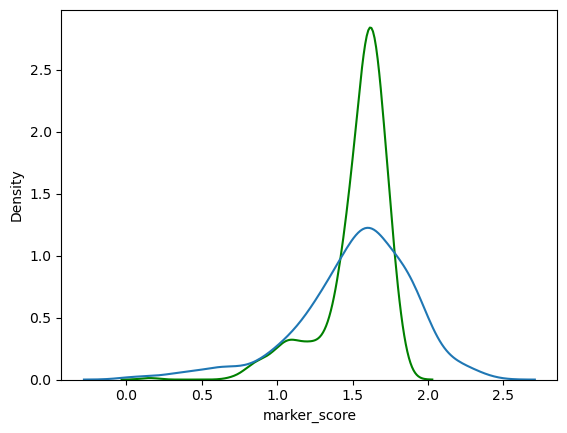

In [57]:
sb.kdeplot(y_pred, color = "g")
sb.kdeplot(y_test)

In [58]:
importances_cb = best_model_cb.feature_importances_
importances_cb = pd.Series(importances_cb, index=prot.columns)
importances_cb=importances_cb.sort_values(ascending=False)

print(importances_cb.head(10))

CD16     19.058764
CD44      6.334037
CD47      6.096450
CD54      4.183628
CD7       3.447818
HLA-E     3.134069
CD328     2.426954
CD57      2.401187
CD82      1.945501
CD314     1.865513
dtype: float64


In [59]:
#df from the top 20 important markers
importances_cb=pd.DataFrame(importances_cb)
importances_cb_top=importances_cb[0:20]
importances_cb_top=importances_cb_top.T

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


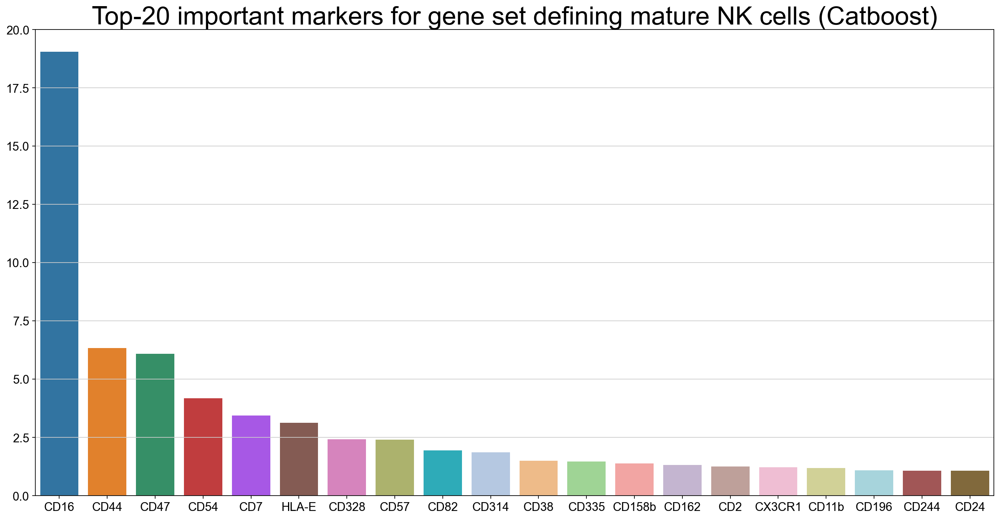

In [73]:
plt.figure(figsize=(20,10))
plt.ylim(0,20)
a=sb.barplot(data=importances_cb_top)

plt.title("Top-20 important markers for gene set defining mature NK cells (Catboost)", fontsize = 30) ;




## 5. UMAP visualization

In [26]:
markers_prot = ['CD16', 'CD44', 'CD47_prot', 'CD54', 'CD7', 'HLA-E_prot', 'CD57', 'CD83_prot', 'CD314']

In [22]:
#Computing a neighborhood of observations using latent space

sc.pp.neighbors(adata_neurips, use_rep="X_totalVI")   

sc.tl.umap(adata_neurips)

In [18]:
#selecting one sample from Neurips

sample =eg[eg.obs['POOL'] == "s4d1"].copy()


In [19]:
sample

AnnData object with n_obs × n_vars = 4885 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47_prot', 'CD48', 'CD40', 'CD154', 'CD52_prot', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD16

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


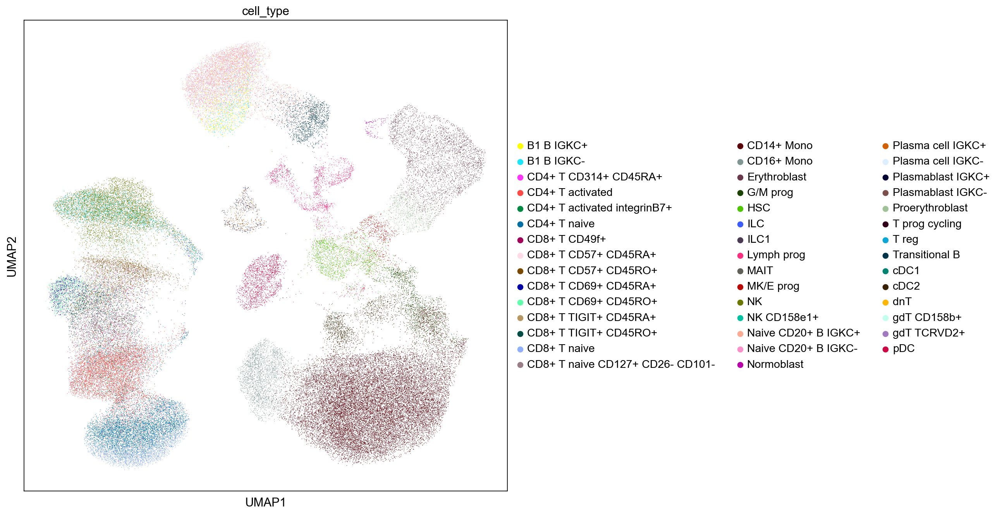

In [23]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_neurips, color = ['cell_type'])

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


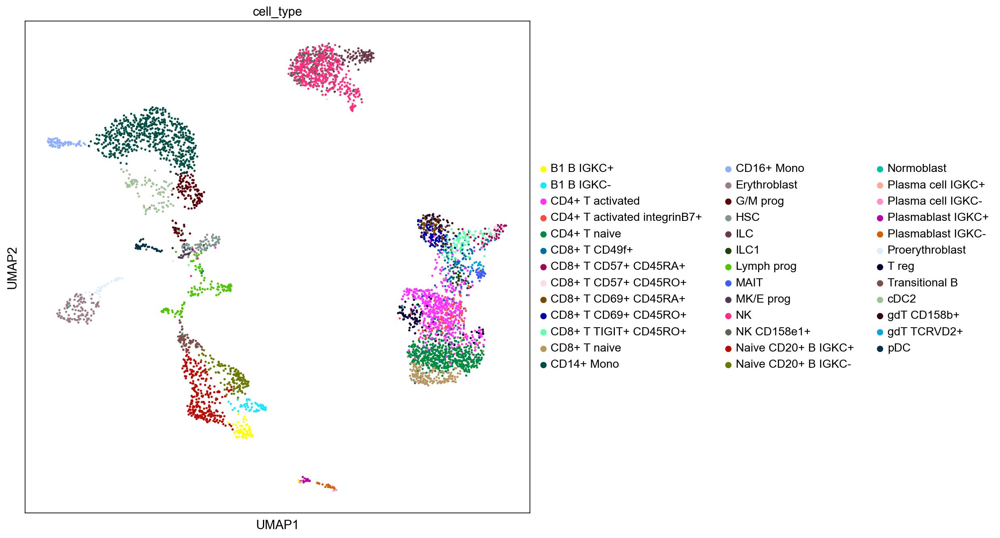

In [24]:
#only one sample

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(sample, color = ['cell_type'])

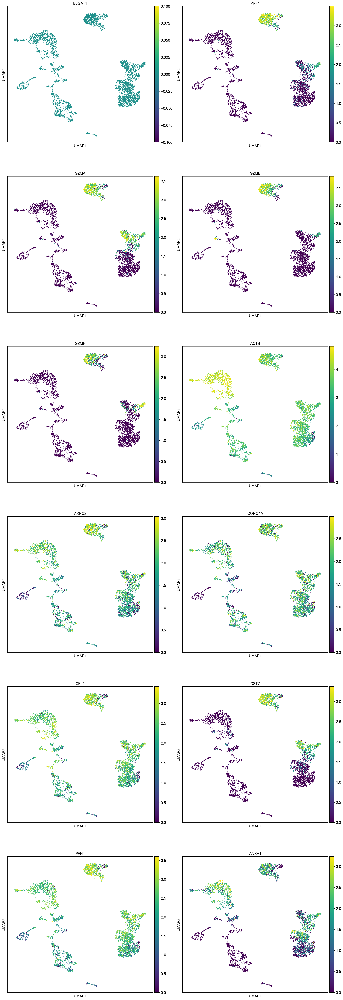

In [34]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(sample, color = markers,  vmax="p99", ncols = 2)

UMAPs above represent RNA markers for mature NK cells (according to Yang et al., paper). 

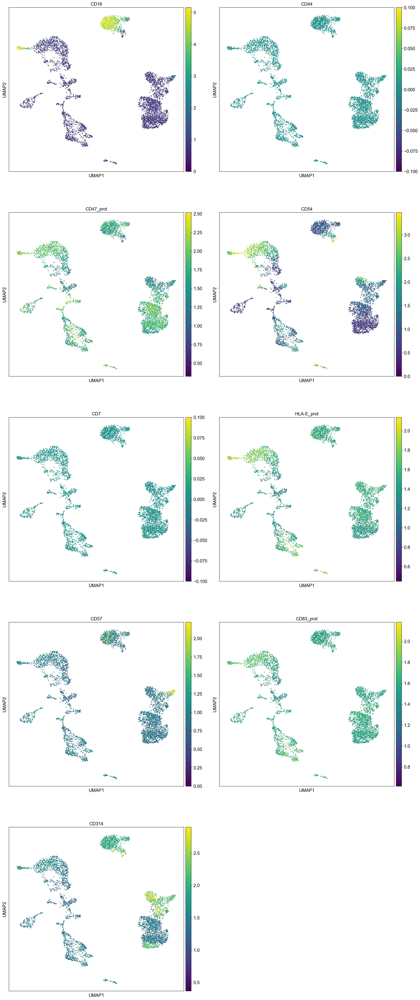

In [35]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(sample, color = markers_prot,  vmax="p99", ncols = 2)

Markers above are important features (surface proteins) identified by CatBoostReggressor. Mostly same markers were identified as important by other tested models as well, but with lower coefficients. CD16 was clearly the most significant, which is also supported by UMAP representation. 